# Food Framing Analysis Script

## Adapted from Tomas Folke 2016 by Pradyumna Sepulveda, Amy Benson and Benedetto de Martino

# Contents

# Data Preparation
## [1. Load Data](#LoadData)
## [2. Eye Blink Check](#CheckBlinks)
## [3. Calculate GSF](#GSF)
## [4. Calculate DDT](#DDT)
## [5. Summary Measures](#summary)
## [6. Compute z and familiarity variables](#zfam)
## [7. Median Split](#split) 
## [8. Participant Exclusion](#PartEx)
# Data Analysis
## [1. Correlation Graphs](#corr)
## [2. Logistic Plots](#log)
## [3. Regression Analysis](#reg)
### [3.1. Regressions per Condition](#regCond)
### [3.2. Regression per Participant](#regPart)
### [3.3. Hierarchical Regression](#regHier)

# Import Packages

In [510]:
import numpy as np
import pandas as pd
from pandas.core.frame import DataFrame as DF
import seaborn as sns
sns.set(color_codes=True)
#np.random.seed(sum(map(ord, "distributions")))
from sklearn import linear_model  # packages for the logistic regression function to plot the logistic regression 
from sklearn.linear_model import LogisticRegression # packages for the logistic regression function to plot the logistic regression 
import scipy
from scipy import stats, integrate
from scipy.stats import mode
from scipy.stats.stats import pearsonr # Pearson's correlation
from copy import copy as copy
import operator as operator
import pylab

# Plotting tools
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
%pylab inline
figsize(5, 5)

import glob
import os

Populating the interactive namespace from numpy and matplotlib


/anaconda3/lib/python3.6/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['copy', 'pylab', 'f']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [511]:
import rpy2


%load_ext rpy2.ipython
# Set up interface with R
# Make it easy to set and find values in a multi-index DF
idx = pd.IndexSlice

# Set up interface with R
%config InlineBackend.figure_format = 'retina'
import warnings
from rpy2.rinterface import RRuntimeWarning
warnings.filterwarnings("ignore", category=RRuntimeWarning)


The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [512]:
%%R
# Use in case the libraries are not available in the system
#install.packages("lme4")
#install.packages("car")
#install.packages("ggplot2")
#install.packages("broom")
#install.packages("arm")
#install.packages("ggplot2")
#install.packages("optimx")
#install.packages("multcomp")

NULL


In [513]:
%%R
library(lme4)
library(car)
library(optimx)
library(ggplot2)
library(MASS)
library(pbkrtest)
library(broom)
library(dplyr)
library(dplyr)
library(reshape2)
library(arm)
library(multcomp)

# Defining Functions

## Taken from Tomas Folke

### Plot distributions

In [514]:
def participant_densities(data, var, xlim=(0,100), rug=True):
    # a counter that tells us where a given participant's data should be plotted
    order = 1

    # a list of all the participants in the dataset
    participants = data.loc[:, 'Part'].unique()

    # defining the figure size
    sns.set_style('white')
    fig = figure(figsize=(15,70))

    for x in participants:
        # defining the sub figures
            sub={}
            sub['%s' % x] = plt.subplot(len(participants)/2, 3, order)
            sns.kdeplot(data.loc[data['Part'] == x, var].values, ax = sub['%s' % x], shade=True)
            #if rug==True:
            #    sns.rugplot(data.loc[data['Part'] == x, var].values, ax = sub['%s' % x])
            sub['%s' % x].set_title('participant %s' % x)
            #sub['%s' % x].set_xlim(xlim)
            order += 1

### Split variable into participantwise quantiles

In [515]:
def parsplit(DF, input, quantiles):
    qvalues = pd.qcut(DF[input], quantiles, labels = range(1, quantiles+1))
    return qvalues

### Full simple logistic graph

In [516]:
def logisticplot_all (moderator, modhigh, modlow, data, xaxis='zDV', yaxis='G_choice', ylab='P(Chose Reference Item)', xlab='DV (Z-score)',
                 modhighcol='#000000', modlowcol='#AAAAAA', title='empty', parvar='SubNo'):
    
    sns.set(font_scale=1.5, style='white')
    fig = figure(figsize=(8,7))
    fig.set_facecolor('white')
    
    # defining the sigmoid function
    def model(x):
        y = 1 / (1 + np.exp(-x))
        return y
    
    sub = plt.subplot()


    #run the classifier
    clf = linear_model.LogisticRegression(C=1e5)

    # Paula used these dictionaries to store the values of the predictive lines for all the participants.
    logit_low = {}
    logit_high = {}

    # I think this defines the problem space
    X_test = np.linspace(-5,10,300)

    # fitting the predictive logistic model for the low_confidence trials, for a participant specified by x
    # first I specify the value difference right - left, then I specify the choices, left or right
    clf.fit(data.loc[data[(data[moderator]==0)].index, xaxis][:, np.newaxis],
            data.loc[data[(data[moderator]==0)].index, yaxis])
    logit_low = model(X_test*clf.coef_ + clf.intercept_).ravel()


    # fitting the predictive logistic model for the high_confidence trials, for a participant specified by x
    # first I specify the value difference right - left, then I specify the choices, left or right
    clf.fit(data.loc[data[(data[moderator]==1)].index, xaxis][:, np.newaxis],
            data.loc[data[(data[moderator]==1)].index, yaxis])
    logit_high = model(X_test * clf.coef_ + clf.intercept_).ravel()

    #Plotting the predictive lines
    line_high = sub.plot(X_test, logit_high, color=modhighcol, linewidth=5, label=modhigh, zorder=6)
    line_low = sub.plot(X_test, logit_low, color=modlowcol, linewidth=5, label=modlow, zorder=5)


    #Plotting the binned data
    data['DVBin2'] = data.groupby(parvar).apply(parsplit, input=xaxis, quantiles=4).values
    
    # determine the x coordinates
    x_cords= data.groupby('DVBin2')[xaxis].mean()
    
    # determine low y coordinates
    y_cords_low = data.loc[(data[moderator]==0), :].groupby('DVBin2')[yaxis].mean().values
    
    # determine low y standard errors
    test = pd.DataFrame(data.loc[(data[moderator]==0), :].groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
    y_low_error = test.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))
    
    
    # determine high y coordinates
    y_cords_high = data.loc[(data[moderator]==1), :].groupby('DVBin2')[yaxis].mean().values
    
    # determine high y standard errors
    test2 = pd.DataFrame(data.loc[data[moderator]==1, :].groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
    y_high_error = test2.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))
    
    # plot the low points
    plt.scatter(x_cords, y_cords_low, c=modlowcol, marker='D', s=60, zorder=1)
    # plot low error bars
    plt.errorbar(x_cords, y_cords_low, yerr=y_low_error, fmt='o', zorder=3, c=modlowcol)
    
    # plot the high points
    plt.scatter(x_cords, y_cords_high, c=modhighcol, marker='o', s=60, zorder=2)
    # plot high error bars
    plt.errorbar(x_cords, y_cords_high, yerr=y_high_error, fmt='o', zorder=4, c=modhighcol)
    
    
    # Set Labels
    sub.set_ylabel(ylab, fontsize=30)
    sub.set_xlabel(xlab, fontsize=30)

    # Set Ticks
    sub.set_xticks((-5,-3,-1,1,3,5))
    sub.set_yticks((0,0.25,0.5,0.75,1))
    sub.tick_params(axis='both', which='major', labelsize=20)

    # Set Limits
    sub.set_ylim(-0.01, 1.01)
    sub.set_xlim(-5, 5)

    # Set Title
    if title == 'empty':
        sub.set_title('')
    else:
        sub.set_title(title)
    
    sub.legend(loc=2, prop={'size':20})
    sns.despine()

### Regression Coefficients Plot

In [517]:
def Coefpresplot(regtable, intercept=False, title='Regression Coefficients', size='big', ylimits=(), ymultiple=0.5, ticklabsize=25, n_ET_predictors = 0):

    # Import itertools so that we can iterate through the colours
    import itertools
    
    # Import locators so that we can tidy up the yaxis
    from matplotlib.ticker import MultipleLocator, FormatStrFormatter
    
    # rounding function to get edges to even 0.5 values
    def round_to(n, precision):
        correction = 0.5 if n >= 0 else -0.5
        return int( n/precision+correction ) * precision

    def round_to_5(n):
        return round_to(n, 0.5)

    # Set seaborn style for the plot
    sns.set(style='white')
    
    # Generate the figure
    if size=='big':
        fig = plt.figure(figsize=[20,8])
    elif size=='long':
        fig = plt.figure(figsize=[20,4])
    elif size=='narrow':
        fig = plt.figure(figsize=[10,4])
        
    fig.suptitle(title, fontsize=20)
    gs = GridSpec(1,1,bottom=0.18,left=0.18,right=0.82)
    ax = fig.add_subplot(gs[0,0])
    
    # Set axis limits based on whether to include the intercept or not    
    if intercept == True:
        XLim = (0.75, len(regtable.columns) + 0.25)
        YLim = (round_to_5(regtable.loc['CImin', :].min()-0.1), round_to_5(regtable.loc['CImax', :].max()+0.2))
    else:
        XLim = (0.75, len(regtable.columns) - 0.75)
        YLim = (round_to_5(regtable.loc['CImin', regtable.columns[1]:].min()-0.2), round_to_5(regtable.loc['CImax', regtable.columns[1]:].max()+0.2))
    if ylimits != ():
        YLim = ylimits
    ax.set_xlim(XLim)
    ax.set_ylim(YLim)
    
    # Draw a line through the 0-value on the y-axis
    line = ax.plot(XLim, [0, 0], color='black', ls='--', alpha = 0.5, lw=3)
    
    
    # If intercept is true, plot the coefficient for the intercept
    if intercept == True:
        Coefficients = regtable.columns
    else:
        Coefficients = regtable.columns[1:]
        
    # Determine the colours for the coefficients based on the n_ET_variable
    n_predictors = len(Coefficients)
    n_non_ET_predictors = n_predictors - n_ET_predictors
    
    colourlist = ['#000000'] * n_non_ET_predictors + ['#03719c'] * n_ET_predictors
    
        
    # Plot all the coefficients with 95% CI
    position = 0
    for Coefficient in Coefficients:
        position += 1
        ax.plot(position, regtable.loc['coefficient', Coefficient], marker='o', ms=8, color=colourlist[position-1],)
        ax.errorbar(position, regtable.loc['coefficient', Coefficient],
                    yerr=regtable.loc['se', Coefficient]*1.96, lw=2, color=colourlist[position-1])

    # Setting the x-axis major tick's location
    ax.set_xticks(range(1, position+1))
    
    # set the y-axis major tick position
    ax.yaxis.set_major_locator(MultipleLocator(ymultiple))


    # Setting the x-axis major tick's label
    if intercept == True:
        ax.set_xticklabels(regtable.columns, rotation=40)
    else: 
        ax.set_xticklabels(regtable.columns[1:], rotation=40)
    
    ax.tick_params(axis='both', which='major', labelsize=ticklabsize)
    ax.set_ylabel('Fixed Effects Coefficients', fontsize=18)
    
    # Autoformats the ticklabels for the xaxis
    fig.autofmt_xdate()
    
    sns.despine()

In [518]:
def Coefpresplot2(regtable,regtable2, intercept=False, title='Regression Coefficients', size='big', ylimits=(), ymultiple=0.5, ticklabsize=25, n_ET_predictors = 0):

    # Import itertools so that we can iterate through the colours
    import itertools
    
    # Import locators so that we can tidy up the yaxis
    from matplotlib.ticker import MultipleLocator, FormatStrFormatter
    
    # rounding function to get edges to even 0.5 values
    def round_to(n, precision):
        correction = 0.5 if n >= 0 else -0.5
        return int( n/precision+correction ) * precision

    def round_to_5(n):
        return round_to(n, 0.5)

    # Set seaborn style for the plot
    sns.set(style='white')
    
    # Generate the figure
    if size=='big':
        fig = plt.figure(figsize=[20,8])
    elif size=='long':
        fig = plt.figure(figsize=[20,4])
    elif size=='narrow':
        fig = plt.figure(figsize=[10,4])
        
    fig.suptitle(title, fontsize=20)
    gs = GridSpec(1,1,bottom=0.18,left=0.18,right=0.82)
    ax = fig.add_subplot(gs[0,0])
    

    # Set axis limits based on whether to include the intercept or not    
    
       
    
    if intercept == True:
        
        XLim = (0.75, len(regtable.columns) + 0.25)
        
        #Determine the Ymax and Ymin for both regresions results
        if round_to_5(regtable.loc['CImin', :].min()) < round_to_5(regtable2.loc['CImin', :].min()):
            Ymin = round_to_5(regtable.loc['CImin', :].min()-0.5)
        else :
            Ymin = round_to_5(regtable2.loc['CImin',:].min()-0.5)
        if round_to_5(regtable.loc['CImax', :].max()) > round_to_5(regtable2.loc['CImax', :].max()):
            Ymax = round_to_5(regtable.loc['CImax', :].max()+0.5)
        else :
            Ymax = round_to_5(regtable2.loc['CImax', :].max()+0.5)      

        YLim = (Ymin, Ymax)    
    else:
        XLim = (0.75, len(regtable.columns) - 0.75)
        
        #Determine the Ymax and Ymin for both regresions results
        if round_to_5(regtable.loc['CImin', regtable.columns[1]:].min()) < round_to_5(regtable2.loc['CImin', regtable.columns[1]:].min()):
            Ymin = round_to_5(regtable.loc['CImin', regtable.columns[1]:].min()-0.5)
        else :
            Ymin = round_to_5(regtable2.loc['CImin',regtable.columns[1]:].min()-0.5)
        if round_to_5(regtable.loc['CImax', regtable.columns[1]:].max()) > round_to_5(regtable2.loc['CImax', regtable.columns[1]:].max()):
            Ymax = round_to_5(regtable.loc['CImax', regtable.columns[1]:].max()+0.5)
        else :
            Ymax = round_to_5(regtable2.loc['CImax', regtable.columns[1]:].max()+0.5)      
        
        YLim = (Ymin, Ymax)
    
    if ylimits != ():
        YLim = ylimits
    ax.set_xlim(XLim)
    ax.set_ylim(YLim)
    
    # Draw a line through the 0-value on the y-axis
    line = ax.plot(XLim, [0, 0], color='black', ls='--', alpha = 0.5, lw=3)
    
    
    # If intercept is true, plot the coefficient for the intercept
    # both regtable should have the same regressors (and in the same order)

    if intercept == True:
        Coefficients = regtable.columns
 #       Coefficients2 = regtable2.columns
    else:
        Coefficients = regtable.columns[1:]
#        Coefficients2 = regtable2.columns[1:]
        
    # Determine the colours for the coefficients based on the n_ET_variable
    n_predictors = len(Coefficients)
    n_non_ET_predictors = n_predictors - n_ET_predictors
    
    colourlist = ['#000000'] * n_non_ET_predictors + ['#03719c'] * n_ET_predictors
    
        
    # Plot all the coefficients with 95% CI
    position = 0
    for Coefficient in Coefficients:
        position += 1
        ax.plot(position-0.1, regtable.loc['coefficient', Coefficient], marker='o', ms=8, color='blue',label = 'Like')
        ax.plot(position+0.1, regtable2.loc['coefficient', Coefficient], marker='X', ms=8, color='red', label = 'Dislike')


        ax.errorbar(position-0.1, regtable.loc['coefficient', Coefficient],
                    yerr=regtable.loc['se', Coefficient]*1.96, lw=2, color='blue')
        ax.errorbar(position+0.1, regtable2.loc['coefficient', Coefficient],
                    yerr=regtable2.loc['se', Coefficient]*1.96, lw=2, color='red')
        
        if position == 1:
            ax.legend( prop={'size': 20})

 
    # Setting the x-axis major tick's location
    ax.set_xticks(range(1, position+1))
    
    # set the y-axis major tick position
    ax.yaxis.set_major_locator(MultipleLocator(ymultiple))

    # Setting the x-axis major tick's label
    if intercept == True:
        ax.set_xticklabels(regtable.columns, rotation=40)
    else: 
        ax.set_xticklabels(regtable.columns[1:], rotation=40)
    
    ax.tick_params(axis='both', which='major', labelsize=ticklabsize)
    ax.set_ylabel('Fixed Effects Coefficients', fontsize=18)
    
    # Autoformats the ticklabels for the xaxis
    fig.autofmt_xdate()

    sns.despine()

In [519]:
def regtable(fix, fix_se, names):
    fixed_betas = DF(np.array(fix)); fixed_betas = fixed_betas.transpose(); fixed_betas.columns = names
    fixed_betas.loc[1] = np.array(fix_se)
    fixed_betas.loc[2] = fixed_betas.loc[0] - (fixed_betas.loc[1]*1.96)
    fixed_betas.loc[3] = fixed_betas.loc[0] + (fixed_betas.loc[1]*1.96)
    fixed_betas.index = ['coefficient', 'se', 'CImin', 'CImax']
    return fixed_betas

# Data Preparation
_____________________________________________________________________________________________________________________

<a id='LoadData'></a>
# 1. Loading Pilot Data

### Load eyetracker data reports generated by EyeLink DataViewer.
#### Loading Interest Area (IA) and Saccade (Sacc) reports

In [417]:
pX_IA ="/Users/bdmlab/OneDrive - University College London/PhD Projects/FoodFramingValue/Reports/IA_FullReport_RTfix_v4.txt"
pX_Sacc ="/Users/bdmlab/OneDrive - University College London/PhD Projects/FoodFramingValue/Reports/SACC_FullReport_RTfix_v4.txt"

pX_IAframe = [pd.read_csv(pX_IA, sep="\t")]
pX_Saccframe = [pd.read_csv(pX_Sacc, sep="\t")]
pX_IAdata = pd.concat(pX_IAframe)
pX_SACCdata = pd.concat(pX_Saccframe)

#### Dataframe with interest Area information

In [418]:
pX_IAdata

,DATA_FILE,IA_ID,trial,Triplet_Identity,trial_type,LL_Item,LL_Value,LR_Item,LR_Value,Chosen_Img,...,IA_DWELL_TIME,IA_DWELL_TIME_%,IA_FIXATION_COUNT,IA_FIXATION_%,IA_MAX_FIX_PUPIL_SIZE,IA_AVERAGE_FIX_PUPIL_SIZE,IA_MIN_FIX_PUPIL_SIZE,IA_RUN_COUNT,TRIAL_DWELL_TIME,TRIAL_FIXATION_COUNT
0,p1.edf,1,1,14,Experiment,116_boots_caramels.png,0.95,31_beef_jerky.png,2.00,31_beef_jerky.png,...,1874,0.6511,6,0.6000,4456.00,4189.50,3814.00,2,2878.0,10
1,p1.edf,2,1,14,Experiment,116_boots_caramels.png,0.95,31_beef_jerky.png,2.00,31_beef_jerky.png,...,628,0.2182,2,0.2000,4183.00,4139.00,4095.00,1,2878.0,10
2,p1.edf,3,1,14,Experiment,116_boots_caramels.png,0.95,31_beef_jerky.png,2.00,31_beef_jerky.png,...,0,0.0000,0,0.0000,.,.,.,0,2878.0,10
3,p1.edf,1,2,44,Experiment,102_propercorn_worcester.png,2.30,26_yorkie.png,1.70,26_yorkie.png,...,1206,0.3777,4,0.4444,4236.00,3859.75,3473.00,2,3193.0,9
4,p1.edf,2,2,44,Experiment,102_propercorn_worcester.png,2.30,26_yorkie.png,1.70,26_yorkie.png,...,1770,0.5543,4,0.4444,3810.00,3315.25,3123.00,2,3193.0,9
5,p1.edf,3,2,44,Experiment,102_propercorn_worcester.png,2.30,26_yorkie.png,1.70,26_yorkie.png,...,0,0.0000,0,0.0000,.,.,.,0,3193.0,9
6,p1.edf,1,3,51,Experiment,59_crunchie.png,1.70,5_caramello.png,1.25,5_caramello.png,...,1020,0.2955,5,0.3846,3986.00,3678.20,3504.00,1,3452.0,13
7,p1.edf,2,3,51,Experiment,59_crunchie.png,1.70,5_caramello.png,1.25,5_caramello.png,...,2091,0.6057,7,0.5385,4202.00,3926.57,3723.00,1,3452.0,13
8,p1.edf,3,3,51,Experiment,59_crunchie.png,1.70,5_caramello.png,1.25,5_caramello.png,...,0,0.0000,0,0.0000,.,.,.,0,3452.0,13
9,p1.edf,1,4,12,Experiment,64_nestle_aero_mint.png,1.55,102_propercorn_worcester.png,2.30,64_nestle_aero_mint.png,...,4024,0.5684,12,0.5217,4156.00,3661.92,3206.00,4,7079.0,23


#### Dataframe with saccade information

In [419]:
pX_SACCdata

,DATA_FILE,trial,Triplet_Identity,CURRENT_SAC_START_INTEREST_AREA_ID,CURRENT_SAC_END_INTEREST_AREA_ID,trial_type
0,p1.edf,145,145,.,.,Practice
1,p1.edf,145,145,.,.,Practice
2,p1.edf,145,145,.,.,Practice
3,p1.edf,145,145,.,.,Practice
4,p1.edf,145,145,.,.,Practice
5,p1.edf,145,145,.,.,Practice
6,p1.edf,145,145,.,.,Practice
7,p1.edf,145,145,.,.,Practice
8,p1.edf,145,145,.,.,Practice
9,p1.edf,145,145,.,.,Practice


## Number of participants and trials 

In [420]:
participant = pX_IAdata['DATA_FILE'].unique()
participant_names = pX_IAdata['DATA_FILE'].unique()

#Extract just names of participant (for folder name in future steps)
yy=0
for xx in participant_names:
    participant_names[yy]=xx.rstrip(".edf")
    yy+=1
print (participant_names)

trial_n = pX_IAdata['trial'].unique()

print("Number of participants:", len(participant))
print ("Number of trials:", len( trial_n))

['p1' 'p5' 'p6' 'p7' 'p8' 'p9' 'p10' 'p11' 'p12' 'p13' 'p14' 'p15' 'p16'
 'p17' 'p18' 'p19' 'p20' 'p21' 'p22' 'p23' 'p24' 'p25' 'p26' 'p27' 'p28'
 'p29' 'p30' 'p31' 'p32' 'p33' 'p34' 'p35' 'p36' 'p37' 'p38' 'p39' 'p40'
 'p41' 'p42' 'p43']
Number of participants: 40
Number of trials: 240


<a id='CheckBlinks'></a>
# 2. Check Blinks across participants

#### Loading dataframe containing trial information for all the participants

In [421]:
pX_TrialRep ="/Users/bdmlab/OneDrive - University College London/PhD Projects/FoodFramingValue/Reports/TrialReport_Blinks_v1.txt"
TrialRepFrame = [pd.read_csv(pX_TrialRep, sep="\t")]
TrialDataFrame = pd.concat(TrialRepFrame)
TrialDataFrame

,DATA_FILE,IP_LABEL,trial,Triplet_Identity,Block_Cond,BLINK_COUNT,AVERAGE_BLINK_DURATION,AVERAGE_FIXATION_DURATION,AVERAGE_SACCADE_AMPLITUDE,AVERAGE_X_RESOLUTION,...,PUPIL_SIZE_MAX_TIME,PUPIL_SIZE_MAX_X,PUPIL_SIZE_MAX_Y,PUPIL_SIZE_MEAN,PUPIL_SIZE_MIN,PUPIL_SIZE_MIN_TIME,PUPIL_SIZE_MIN_X,PUPIL_SIZE_MIN_Y,EYE_USED,trial_type
0,p1.edf,ChoiceOnly,145,145,1.0,6,273.00,454.93,3.65,35.94,...,4280851.00,497.40,378.50,4832.71,2958.00,4296769.00,313.30,953.70,RIGHT,Practice
1,p1.edf,ChoiceOnly,146,146,2.0,0,.,709.83,4.33,35.28,...,4314435.00,498.20,372.80,4506.99,3947.00,4314951.00,255.50,425.90,RIGHT,Practice
2,p1.edf,ChoiceOnly,147,147,2.0,0,.,455.55,2.30,35.17,...,4324103.00,507.60,378.10,4417.05,3876.00,4324645.00,284.90,463.30,RIGHT,Practice
3,p1.edf,ChoiceOnly,148,148,1.0,0,.,372.47,4.17,35.25,...,4334809.00,497.30,384.20,4108.87,3366.00,4335979.00,710.20,520.30,RIGHT,Practice
4,p1.edf,ChoiceOnly,1,14,2.0,1,540.00,286.33,3.88,35.42,...,4365233.00,517.20,317.40,4229.86,3771.00,4367179.00,359.10,477.60,RIGHT,Experiment
5,p1.edf,ChoiceOnly,2,44,2.0,0,.,467.78,5.10,35.21,...,4375159.00,347.40,382.70,3955.69,3052.00,4378277.00,721.80,527.80,RIGHT,Experiment
6,p1.edf,ChoiceOnly,3,51,2.0,0,.,343.77,2.02,35.16,...,4385077.00,494.40,390.10,4068.65,3451.00,4385743.00,267.40,453.70,RIGHT,Experiment
7,p1.edf,ChoiceOnly,4,12,2.0,4,60.00,309.27,3.26,35.31,...,4396787.00,484.00,384.50,3675.82,1367.00,4401557.00,-23.40,1045.70,RIGHT,Experiment
8,p1.edf,ChoiceOnly,5,4,2.0,0,.,275.00,3.78,35.29,...,4411993.00,314.80,287.90,3803.21,1966.00,4412519.00,526.50,973.60,RIGHT,Experiment
9,p1.edf,ChoiceOnly,6,39,2.0,0,.,389.12,3.83,35.28,...,4425293.00,495.20,391.90,4070.23,3511.00,4426433.00,706.70,502.00,RIGHT,Experiment


In [422]:
BlinkMatrix = []
partBlink = TrialDataFrame['DATA_FILE'].unique()
partBlink

array(['p1.edf', 'p5.edf', 'p6.edf', 'p7.edf', 'p8.edf', 'p9.edf',
       'p10.edf', 'p11.edf', 'p12.edf', 'p13.edf', 'p14.edf', 'p15.edf',
       'p16.edf', 'p17.edf', 'p18.edf', 'p19.edf', 'p20.edf', 'p21.edf',
       'p22.edf', 'p23.edf', 'p24.edf', 'p25.edf', 'p26.edf', 'p27.edf',
       'p28.edf', 'p29.edf', 'p30.edf', 'p31.edf', 'p32.edf', 'p33.edf',
       'p34.edf', 'p35.edf', 'p36.edf', 'p37.edf', 'p38.edf', 'p39.edf',
       'p40.edf', 'p41.edf', 'p42.edf', 'p43.edf'], dtype=object)

In [423]:
# Extracting information for each participant

for k in range(0,len(partBlink)):
 
    pX_Blinks = TrialDataFrame.loc[(TrialDataFrame['DATA_FILE']==partBlink[k]) & (TrialDataFrame['trial_type']== 'Experiment')]
    
    
    
    Blink_Count_trial =  pX_Blinks['BLINK_COUNT']
    Blink_Average_trial =  pd.to_numeric(pX_Blinks['AVERAGE_BLINK_DURATION'], errors='coerce')
    Duration_trial =  pd.to_numeric(pX_Blinks['DURATION'], errors='coerce')


    Blink_Count_part = Blink_Count_trial.mean()
    Blink_CountSD_part = Blink_Count_trial.std()
    Blink_Average_part = Blink_Average_trial.mean(skipna = True)
    Blink_AverageSD_part = Blink_Average_trial.std(skipna = True)
    Duration_part = Duration_trial.mean(skipna = True)

    BlinkMatrix.append([partBlink[k] , Blink_Count_part, Blink_CountSD_part, Blink_Average_part, Blink_AverageSD_part, Duration_part]) 
    

BlinkMatrix=pd.DataFrame(BlinkMatrix,columns=['Participant', 'BlinkCountAverage', 'BlinkCountStd', 'BlinkTimeAverage', 'BlinkTimeAverageStd','TrialDurationAverage'])



##### BlinkCountAverage : mean blink number during all the trials for each participant
##### BlinkTimeAverage : mean duration (ms) of a blink event for each participant
##### TrialDurationAverage : mean duration (ms) of the trial for each participant

In [424]:
BlinkMatrix

,Participant,BlinkCountAverage,BlinkCountStd,BlinkTimeAverage,BlinkTimeAverageStd,TrialDurationAverage
0,p1.edf,0.370833,0.672209,92.042254,80.064957,7997.291667
1,p5.edf,1.687500,1.163537,189.220090,88.097275,6377.383333
2,p6.edf,1.070833,0.881696,115.250879,38.817476,6987.525000
3,p7.edf,1.195833,1.038578,135.605978,78.495276,7628.466667
4,p8.edf,1.054167,1.128364,106.463613,17.419231,6757.916667
5,p9.edf,3.137500,1.214388,132.536250,46.917266,6479.941667
6,p10.edf,0.445833,0.624787,133.271739,71.207189,6942.641667
7,p11.edf,0.154167,0.538461,169.118929,317.848335,6862.675000
8,p12.edf,0.329167,0.610219,208.746032,123.446602,6227.416667
9,p13.edf,2.287500,1.041327,157.710462,48.511869,7254.366667


##### (*)Participant 40 (p40.edf) is the one with the hisghest number of blink events and the one with longer average blinking among all the participants. Additionally, he lost one trial beacuse of no fixations. p40.edf is taken out from posterior analysis.

### Preliminary subject extraction

In [425]:
#Subject 40 becuase of sleepineess during the experiment
delete_index = []
for i in range(len(participant)):
    if participant_names[i]=='p40':
        delete_index = i
print('Eliminated participant ', delete_index)
print('Eliminated participant name'  ,participant_names[delete_index])
        
participant_names = np.delete(participant_names, [delete_index], None)
participant = np.delete(participant, [delete_index], None)
participant

Eliminated participant  36
Eliminated participant name p40


array(['p1.edf', 'p5.edf', 'p6.edf', 'p7.edf', 'p8.edf', 'p9.edf',
       'p10.edf', 'p11.edf', 'p12.edf', 'p13.edf', 'p14.edf', 'p15.edf',
       'p16.edf', 'p17.edf', 'p18.edf', 'p19.edf', 'p20.edf', 'p21.edf',
       'p22.edf', 'p23.edf', 'p24.edf', 'p25.edf', 'p26.edf', 'p27.edf',
       'p28.edf', 'p29.edf', 'p30.edf', 'p31.edf', 'p32.edf', 'p33.edf',
       'p34.edf', 'p35.edf', 'p36.edf', 'p37.edf', 'p38.edf', 'p39.edf',
       'p41.edf', 'p42.edf', 'p43.edf'], dtype=object)

<a id='GSF'></a>
# 3. Calculate GSF for each participant and trial

In [426]:
i=0
GSF_matrix = []

#Run for each individual participant
for i in range(len(participant)):
    #Extract the number of trials for this participant
    pX_indSubj = pX_SACCdata.loc[(pX_SACCdata['DATA_FILE']==participant[i]) & (pX_SACCdata['trial_type']== 'Experiment')]
    
    #Add number of trials for the experiment
    #trial_n = pX_indSubj['trial'].unique()
    trial_n = range(240)
    for  j in range(len(trial_n)):
            # extract saccade data for this participant
            GSF_data=pX_SACCdata.loc[(pX_SACCdata['DATA_FILE']==participant[i]) & (pX_SACCdata['trial']== j+1) & (pX_SACCdata['trial_type']== 'Experiment')]


            # considered direct glance transition between IA 1 (left) and IA 2 (right)
            booatstart_p1=GSF_data['CURRENT_SAC_START_INTEREST_AREA_ID'] == '2'
            booatend_p1=GSF_data['CURRENT_SAC_END_INTEREST_AREA_ID'] == '1'
            booatstart_p2=GSF_data['CURRENT_SAC_START_INTEREST_AREA_ID'] == '1'
            booatend_p2=GSF_data['CURRENT_SAC_END_INTEREST_AREA_ID'] == '2'            
            
            #Count shift only if the saccade goes from one area to the other (right to left or left to right item)
            shifts_p1= booatstart_p1 & booatend_p1
            shifts_p2= booatstart_p2 & booatend_p2

            shifts_total = shifts_p1 | shifts_p2
            #Count the total number of shifts in this trial
            trialGSF = sum(shifts_total*1)
            
            #Extract the region (left or right) for the last fixation
            go_back = 1
            tail_fix = GSF_data['CURRENT_SAC_END_INTEREST_AREA_ID'].tail(go_back)  
            
            # If we have not fixation information we don't skip it, we fill with zeros
            if GSF_data.empty:
                print ('skipped: participant:',participant[i],'trial',j+1)
                #continue
            
            ## If the sequence is empty, we assign 0 to tail
            if tail_fix.empty:
                tail_fix = 0
            else:
                tail_fix = tail_fix.values[0]
            
            while ('.'== tail_fix) | ('3'== tail_fix):
                go_back = go_back + 1
                tail_fix = GSF_data['CURRENT_SAC_END_INTEREST_AREA_ID'].tail(go_back)
                #Since tail gets the last n subjects we need to just pick the one on top
                tail_fix_aux = tail_fix.values
                tail_fix = tail_fix_aux[0]
            
            #add GSF trial info to a new row if the matrix
            GSF_matrix.append([participant[i], j+1, trialGSF, tail_fix]) #trial number, trial GSF, last_fixation
      

skipped: participant: p31.edf trial 52


In [427]:
#Visualize GSF_matrix
#GSF_matrix

<a id='DDT'></a>
# 4. Calculate DDT for each participant and trial

In [428]:
# Extract measures of dwell time (DT) per Interest Area (IA) in a particular trial
# IA1: left item ; IA2 : right item ; IA3: condition icon
IA1_data=pX_IAdata.loc[(pX_IAdata['DATA_FILE']==participant[i]) & (pX_IAdata['trial']== j+1) & (pX_IAdata['IA_ID']== 1) & (pX_IAdata['trial_type']== 'Experiment')]
IA2_data=pX_IAdata.loc[(pX_IAdata['DATA_FILE']==participant[i]) & (pX_IAdata['trial']== j+1) & (pX_IAdata['IA_ID']== 2) & (pX_IAdata['trial_type']== 'Experiment')]
IA3_data=pX_IAdata.loc[(pX_IAdata['DATA_FILE']==participant[i]) & (pX_IAdata['trial']== j+1) & (pX_IAdata['IA_ID']== 3) & (pX_IAdata['trial_type']== 'Experiment')]

print ("Information contained in IA report ")
list(IA1_data)

Information contained in IA report 


['DATA_FILE',
 'IA_ID',
 'trial',
 'Triplet_Identity',
 'trial_type',
 'LL_Item',
 'LL_Value',
 'LR_Item',
 'LR_Value',
 'Chosen_Img',
 'CHOICE_KEYPRESS',
 'CHOICE_RT',
 'CONF',
 'CONF_RT',
 'Block_Cond',
 'IA_DWELL_TIME',
 'IA_DWELL_TIME_%',
 'IA_FIXATION_COUNT',
 'IA_FIXATION_%',
 'IA_MAX_FIX_PUPIL_SIZE',
 'IA_AVERAGE_FIX_PUPIL_SIZE',
 'IA_MIN_FIX_PUPIL_SIZE',
 'IA_RUN_COUNT',
 'TRIAL_DWELL_TIME',
 'TRIAL_FIXATION_COUNT']

In [429]:
i=0
DDT_matrix = []

#Extract information for each participant. Behavioural parameters also extracted from this report.
for i in range(len(participant)):
    pX_indSubj = pX_IAdata.loc[(pX_IAdata['DATA_FILE']==participant[i]) & (pX_IAdata['trial_type']== 'Experiment')]
    #Add number of trials for the experiment
    trial_n = pX_indSubj['trial'].unique()
    trial_n = range(240)
    for  j in range(len(trial_n)):
            #Extract DT information for the trial IA1 :left ; IA2 : right
            IA1_data=pX_IAdata.loc[(pX_IAdata['DATA_FILE']==participant[i]) & (pX_IAdata['trial']== j+1) & (pX_IAdata['IA_ID']== 1) & (pX_IAdata['trial_type']== 'Experiment')]
            IA2_data=pX_IAdata.loc[(pX_IAdata['DATA_FILE']==participant[i]) & (pX_IAdata['trial']== j+1) & (pX_IAdata['IA_ID']== 2) & (pX_IAdata['trial_type']== 'Experiment')]

            
            #Save additional behavioural parameters
            trial_PairID = IA1_data['Triplet_Identity'].values[0]
            trial_LL_Item = IA1_data['LL_Item'].values[0]
            trial_LL_Value = IA1_data['LL_Value'].values[0]
            trial_LR_Item = IA1_data['LR_Item'].values[0]
            trial_LR_Value = IA1_data['LR_Value'].values[0]
            if IA1_data['CHOICE_KEYPRESS'].values[0] == 'm':
                trial_ChosenItm = 1  # 1: selected item is Right ; 0: selected item is Left
            else: 
                trial_ChosenItm = 0
            trial_ChoiceRT = IA1_data['CHOICE_RT'].values[0]
            trial_Conf = IA1_data['CONF'].values[0]
            trial_ConfRT = IA1_data['CONF_RT'].values[0]
            trial_BlockCond = IA1_data['Block_Cond'].values[0] #1:like 2: dislike
            
            #Calculate DDT values for the trial
            IA_1_DT = IA1_data['IA_DWELL_TIME'].values[0]
            IA_2_DT = IA2_data['IA_DWELL_TIME'].values[0]
            
            # If participant did not spend time in the Interest Areas we should skip it
            if (IA_1_DT == 0) & (IA_2_DT == 0):
                print(IA_1_DT == 0 & IA_2_DT == 0)
                print ('area1',IA_1_DT,'area2',IA_2_DT)
                print ('skipped: participant:',i,'trial',j+1)
                continue
            
            trialDDT = -IA_1_DT + IA_2_DT # since DDT_GSF_Zvalue_trial_part_v2.csv we use RIGHT - LEFT
            
            #define matrix DDT + behavioural parameters
            #DDT_matrix.append([participant[i], j+1, trial_PairID, trial_LL_Item, trial_LL_Value, trial_LR_Item, trial_LR_Value, trial_ChosenItm, trial_ChoiceRT, trial_Conf, trial_ConfRT, trial_BlockCond, trialDDT,IA_1_DT, IA_2_DT]) 
            DDT_matrix.append([i+1, j+1, trial_PairID, trial_LL_Item, trial_LL_Value, trial_LR_Item, trial_LR_Value, trial_ChosenItm, trial_ChoiceRT, trial_Conf, trial_ConfRT, trial_BlockCond, trialDDT,IA_1_DT, IA_2_DT]) 

#list(DDT_matrix)

#### Stack both results (GSF and DDT) matrices together

In [430]:
DDT_GSF_trial = np.column_stack((DDT_matrix,GSF_matrix))
DDT_GSF_trial

array([['1', '1', '14', ..., '1', '3', '1'],
       ['1', '2', '44', ..., '2', '3', '2'],
       ['1', '3', '51', ..., '3', '1', '2'],
       ...,
       ['39', '238', '18', ..., '238', '2', '1'],
       ['39', '239', '42', ..., '239', '3', '2'],
       ['39', '240', '54', ..., '240', '1', '1']], dtype='<U36')

#### Delete redundant columns(from GSF)

In [431]:
DDT_GSF_trial = np.delete(DDT_GSF_trial, 15, 1) # remove subject_name redundant columns
DDT_GSF_trial = np.delete(DDT_GSF_trial, 15, 1) # remove trial_num redudant column
DDT_GSF_trial

array([['1', '1', '14', ..., '628', '3', '1'],
       ['1', '2', '44', ..., '1770', '3', '2'],
       ['1', '3', '51', ..., '2091', '1', '2'],
       ...,
       ['39', '238', '18', ..., '1455', '2', '1'],
       ['39', '239', '42', ..., '2884', '3', '2'],
       ['39', '240', '54', ..., '896', '1', '1']], dtype='<U36')

#### Insert headers

In [432]:
DDT_GSF_head = np.insert(DDT_GSF_trial,  0, np.array(('Part', 'TrialN', 'PairID', 'L_Item', 'L_Value', 'R_Item', 'R_Value', 'ChosenITM', 'ChoiceRT', 'Conf', 'ConfRT', 'BlockCond', 'tDDT', 'L_IA_DT', 'R_IA_DT', 'tGSF','lastFixat')), axis=0)
DDT_GSF_head

array([['Part', 'TrialN', 'PairID', ..., 'R_IA_DT', 'tGSF', 'lastFixat'],
       ['1', '1', '14', ..., '628', '3', '1'],
       ['1', '2', '44', ..., '1770', '3', '2'],
       ...,
       ['39', '238', '18', ..., '1455', '2', '1'],
       ['39', '239', '42', ..., '2884', '3', '2'],
       ['39', '240', '54', ..., '896', '1', '1']], dtype='<U36')

<a id='summary'></a>
# 5. Display Summary Measures

In [433]:
#Generate DataFrame for new summary table 
DataFrameSum1=pd.DataFrame(DDT_GSF_head,columns=['Part', 'TrialN', 'PairID', 'L_Item', 'L_Value', 'R_Item', 'R_Value', 'ChosenITM', 'ChoiceRT', 'Conf', 'ConfRT', 'BlockCond', 'tDDT', 'L_IA_DT', 'R_IA_DT', 'tGSF','lastFixat'])
DataFrameSum1=DataFrameSum1.drop(DataFrameSum1.index[0])
DataFrameSum1

,Part,TrialN,PairID,L_Item,L_Value,R_Item,R_Value,ChosenITM,ChoiceRT,Conf,ConfRT,BlockCond,tDDT,L_IA_DT,R_IA_DT,tGSF,lastFixat
1,1,1,14,116_boots_caramels.png,0.95,31_beef_jerky.png,2.0,1,3327,72,2427,2.0,-1246,1874,628,3,1
2,1,2,44,102_propercorn_worcester.png,2.3,26_yorkie.png,1.7,1,3424,68,2443,2.0,564,1206,1770,3,2
3,1,3,51,59_crunchie.png,1.7,5_caramello.png,1.25,1,3691,68,3753,2.0,1071,1020,2091,1,2
4,1,4,12,64_nestle_aero_mint.png,1.55,102_propercorn_worcester.png,2.3,0,8144,68,2981,2.0,-1364,4024,2660,4,1
5,1,5,4,44_walkers_french_fries.png,2.0,111_propercorn_sweetnsalty.png,2.0,0,6559,88,2748,2.0,-1454,3478,2024,4,1
6,1,6,39,50_nakd_rhubarb_and_custard.png,0.65,39_milkyway.png,1.25,0,5595,86,4134,2.0,-2305,3511,1206,3,1
7,1,7,59,54_milkyway_magic_stars.png,1.55,30_starburst_original.png,1.1,1,2470,78,2759,2.0,689,670,1359,1,2
8,1,8,16,116_boots_caramels.png,0.95,104_graze_sriracha.png,0.65,1,6091,72,2107,2.0,1331,1858,3189,2,2
9,1,9,1,62_cadbury_wispa.png,1.55,47_daim.png,1.7,1,4669,68,2732,2.0,686,1604,2290,3,2
10,1,10,48,44_walkers_french_fries.png,2.0,53_eat_natural_almond_apricot.png,1.1,1,4001,66,2461,2.0,2102,542,2644,1,2


## Confidence distributions

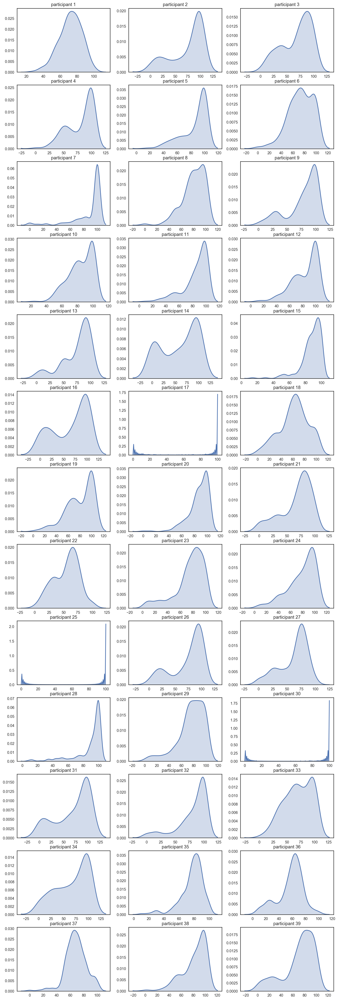

In [434]:
participant_densities(DataFrameSum1,'Conf')

## Choice RT distributions

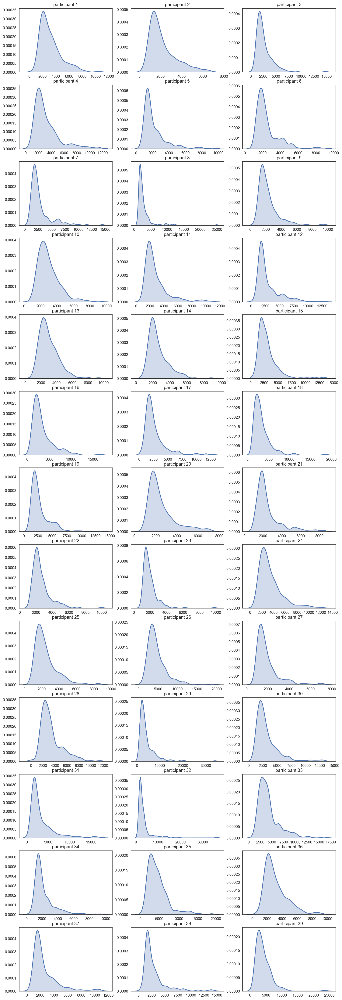

In [435]:
participant_densities(DataFrameSum1,'ChoiceRT',)

## Trial DDT distributions

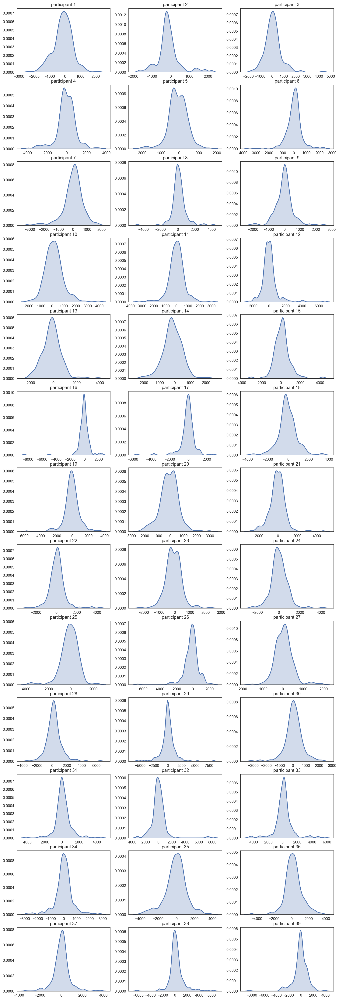

In [436]:
participant_densities(DataFrameSum1,'tDDT')

##  Item value distributions

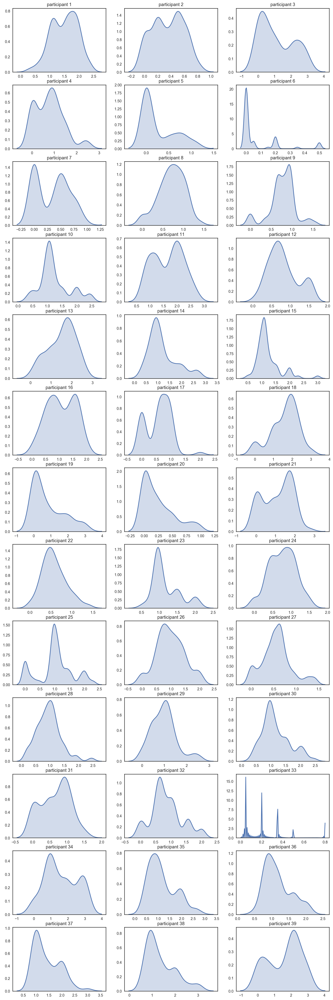

In [437]:
participant_densities(DataFrameSum1,'R_Value') # Distribution of value of items 
#(Right and left distributions are identical since we have the permutation)

## Trial GSF

<a id='zfam'></a>
# 6. Calculate Z-scores 

In [439]:
# Calculate Z-values and other 
z_matrix=[]
z_matrix_aux=[]

for i in (DataFrameSum1['Part'].unique()):
    Choicedata = DataFrameSum1.loc[DataFrameSum1['Part'] == str(i)]
    # from v3 and on we define DV as  RIGHT - LEFT values of the items
    pX_DV = - pd.to_numeric(Choicedata["L_Value"]) + pd.to_numeric(Choicedata["R_Value"])
    pX_zDV = (pX_DV - np.mean(pX_DV))/np.std(pX_DV)
    pX_absDV = abs(- pd.to_numeric(Choicedata['L_Value']) + pd.to_numeric(Choicedata['R_Value']))
    pX_zAbsDV = (pX_absDV - np.mean(pX_absDV))/np.std(pX_absDV)
    pX_zConf = (pd.to_numeric(Choicedata['Conf']) - np.mean(pd.to_numeric(Choicedata['Conf'])))/np.std(pd.to_numeric(Choicedata['Conf']))
    pX_zChoiceRT = (pd.to_numeric(Choicedata['ChoiceRT'] )- np.mean(pd.to_numeric(Choicedata['ChoiceRT'])))/np.std(pd.to_numeric(Choicedata['ChoiceRT']))
    
    
    z_matrix_aux= np.column_stack((pX_DV,pX_zDV,pX_absDV,pX_zAbsDV,pX_zConf,pX_zChoiceRT))
    
    for  j in range(len(z_matrix_aux)):    
        z_matrix.append(z_matrix_aux[j])

In [440]:
Final_trial = np.column_stack((DDT_GSF_trial,z_matrix))
Final_head = np.insert(Final_trial,  0, np.array(('Part', 'TrialN', 'PairID', 'L_Item', 'L_Value', 'R_Item', 'R_Value', 'ChosenITM', 'ChoiceRT', 'Conf', 'ConfRT', 'BlockCond', 'tDDT', 'L_IA_DT', 'R_IA_DT', 'tGSF','lastFixat','DV','zDV','absDV','zAbsDV','zConf','zChoiceRT')), axis=0)
Final_head

array([['Part', 'TrialN', 'PairID', ..., 'zAbsDV', 'zConf', 'zChoiceRT'],
       ['1', '1', '14', ..., '1.5175525332012054',
        '-0.016205609317923964', '0.09811172039487039'],
       ['1', '2', '44', ..., '0.26452750578736517',
        '-0.3153860890334407', '0.15917416794981182'],
       ...,
       ['39', '238', '18', ..., '-1.2364620425235286',
        '1.0373498752733437', '-0.29323147365499813'],
       ['39', '239', '42', ..., '-1.2970729269609564',
        '1.1124521286867983', '0.49510045936709857'],
       ['39', '240', '54', ..., '0.3394209528495948',
        '0.9622476218598889', '-0.9156207887503862']], dtype='<U36')

In [441]:
#save text file with DDT and GSF for each participant/trial
#np.savetxt("DataFoodFramingNotebook_v1.csv", Final_head, delimiter=",", fmt='%s')

## Extract familiarity information from the BDM and add it to each trial in the choice step of the experiment

## Load data in python - Choice Data

In [442]:
#Load choice trial values (saved in previous stage)

#LOAD FROM FILE
#data_exp1 = pd.read_csv('/Users/bdmlab/Google Drive/BdM Projects/FoodFraming_Amy/Analysis Scripts/DataFoodFramingNotebook_v1.csv') # The main data file for the first

#CONTINUE USING DATASET FROM PREVIOUS STAGE
data_exp1 = pd.DataFrame(Final_trial,columns = ['Part', 'TrialN', 'PairID', 'L_Item', 'L_Value', 'R_Item', 'R_Value', 'ChosenITM', 'ChoiceRT', 'Conf', 'ConfRT', 'BlockCond', 'tDDT', 'L_IA_DT', 'R_IA_DT', 'tGSF','lastFixat','DV','zDV','absDV','zAbsDV','zConf','zChoiceRT'])

data_exp1.head()

,Part,TrialN,PairID,L_Item,L_Value,R_Item,R_Value,ChosenITM,ChoiceRT,Conf,...,L_IA_DT,R_IA_DT,tGSF,lastFixat,DV,zDV,absDV,zAbsDV,zConf,zChoiceRT
0,1,1,14,116_boots_caramels.png,0.95,31_beef_jerky.png,2.0,1,3327,72,...,1874,628,3,1,1.05,1.6944302139657446,1.05,1.5175525332012054,-0.016205609317923964,0.09811172039487039
1,1,2,44,102_propercorn_worcester.png,2.3,26_yorkie.png,1.7,1,3424,68,...,1206,1770,3,2,-0.5999999999999999,-0.9682458365518538,0.5999999999999999,0.26452750578736517,-0.3153860890334407,0.15917416794981182
2,1,3,51,59_crunchie.png,1.7,5_caramello.png,1.25,1,3691,68,...,1020,2091,1,2,-0.44999999999999996,-0.7261843774138904,0.44999999999999996,-0.15314750335058117,-0.3153860890334407,0.3272532761680527
3,1,4,12,64_nestle_aero_mint.png,1.55,102_propercorn_worcester.png,2.3,0,8144,68,...,4024,2660,4,1,0.7499999999999998,1.210307295689817,0.7499999999999998,0.6822025149253115,-0.3153860890334407,3.13046027577789
4,1,5,4,44_walkers_french_fries.png,2.0,111_propercorn_sweetnsalty.png,2.0,0,6559,88,...,3478,2024,4,1,0.0,1.0451085762029445e-17,0.0,-1.4061725307644208,1.1805163095441429,2.132687292534775


In [443]:
len(data_exp1)

9360

## Load data in python - BDM data

In [444]:
#Extract BDM data from all the subject folders (Separated folder for each participant, each one containing the file "BDM_RESULTS_FILE.txt")

#INPUT PATH FOR BDM_RESULTS_FILE folder
main_path = "/Users/bdmlab/OneDrive - University College London/PhD Projects/FoodFramingValue/Food Framing Data Raw/"
file_list = os.listdir(main_path)

print("File List in Folder")
print(sorted(file_list))

File List in Folder
['.DS_Store', 'p1', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'p27', 'p28', 'p29', 'p30', 'p31', 'p32', 'p33', 'p34', 'p35', 'p36', 'p37', 'p38', 'p39', 'p40', 'p41', 'p42', 'p43', 'p5', 'p6', 'p7', 'p8', 'p9']


In [445]:
file_array = []

for k in range(len(participant_names)):
        BDM_filename = "/BDM_RESULTS_FILE.txt"
        files =  main_path + participant_names[k] + BDM_filename
        file_array.append(files) 
        
print("number of files to load:" ,len(file_array))        
file_array
#Make sure that the paths are properly defined 

number of files to load: 39


['/Users/bdmlab/OneDrive - University College London/PhD Projects/FoodFramingValue/Food Framing Data Raw/p1/BDM_RESULTS_FILE.txt',
 '/Users/bdmlab/OneDrive - University College London/PhD Projects/FoodFramingValue/Food Framing Data Raw/p5/BDM_RESULTS_FILE.txt',
 '/Users/bdmlab/OneDrive - University College London/PhD Projects/FoodFramingValue/Food Framing Data Raw/p6/BDM_RESULTS_FILE.txt',
 '/Users/bdmlab/OneDrive - University College London/PhD Projects/FoodFramingValue/Food Framing Data Raw/p7/BDM_RESULTS_FILE.txt',
 '/Users/bdmlab/OneDrive - University College London/PhD Projects/FoodFramingValue/Food Framing Data Raw/p8/BDM_RESULTS_FILE.txt',
 '/Users/bdmlab/OneDrive - University College London/PhD Projects/FoodFramingValue/Food Framing Data Raw/p9/BDM_RESULTS_FILE.txt',
 '/Users/bdmlab/OneDrive - University College London/PhD Projects/FoodFramingValue/Food Framing Data Raw/p10/BDM_RESULTS_FILE.txt',
 '/Users/bdmlab/OneDrive - University College London/PhD Projects/FoodFramingValue

In [446]:
#define partipant names(numbers)
participant = (data_exp1['Part'].unique())
participant

array(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23',
       '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34',
       '35', '36', '37', '38', '39'], dtype=object)

### Adding familiarity values and new variables

In [447]:
FamLeft  = []
FamRight = []
Tot_Fam = []
DFam = []
FamChosen = []
FamUnChosen = []
ValChosen = []
ValUnChosen = []
Tot_Val = []
Correct_val = []
correct = []

trial_count = 0

#for cycle for participant
for k in range(0,len(file_array)):
    BDMframe = [pd.read_csv(file_array[k], sep="\t")]
    BDMdata = pd.concat(BDMframe)
    
    #for cycle for trials 
    data_part = data_exp1.loc[(data_exp1['Part'] == str(participant[k]))]
    trial_n = data_part['TrialN'].unique()
    #print(data_part)

    for  j in range(len(trial_n)):    
        #Pick identity left item  
    
        L_item_name = data_part['L_Item'][trial_count]
        FamValue_L = BDMdata.loc[(BDMdata['BDM_ITM']== L_item_name),'BDM_FAM'].values[0]
        Value_L = BDMdata.loc[(BDMdata['BDM_ITM']== L_item_name),'BDM_VAL'].values[0]
        
        #Pick identity right item
        
        R_item_name = data_part['R_Item'][trial_count]
        FamValue_R = BDMdata.loc[(BDMdata['BDM_ITM']== R_item_name),'BDM_FAM'].values[0]
        Value_R = BDMdata.loc[(BDMdata['BDM_ITM']== R_item_name),'BDM_VAL'].values[0]
        
        
        ChosenITMtrial = data_part['ChosenITM'][trial_count]
        BlockCondtrial = data_part['BlockCond'][trial_count]

        if ChosenITMtrial == "1":  #Selected Item is Right
            FamChosenT  = FamValue_R
            FamUnChosenT  = FamValue_L
            ValUnChosenT  = Value_L
            ValChosenT  = Value_R
            
            if BlockCondtrial == "1.0": # Block is like, correct chosen is higher value
                if Value_R >= Value_L:
                    correct = 1
                else: 
                    correct = 0
            
            if BlockCondtrial == "2.0" :# Block is dislike, correct chosen is lower value
                if Value_L >= Value_R:
                    correct = 1
                else: 
                    correct = 0  
                
        else: # Selected item is Left
            FamChosenT  = FamValue_L
            FamUnChosenT  = FamValue_R
            ValUnChosenT  = Value_R           
            ValChosenT = Value_L
            
            if BlockCondtrial == "1.0": # Block is like, correct chosen is higher value
                if Value_L >= Value_R:
                    correct = 1
                else: 
                    correct = 0
            
            if BlockCondtrial == "2.0" :# Block is dislike, correct chosen is lower value
                if Value_R >= Value_L:
                    correct = 1
                else: 
                    correct = 0  
        
        FamValTot = FamValue_L + FamValue_R
        DFamT =  FamValue_R - FamValue_L 
        
        
        ValTot = Value_L + Value_R
        
        #add to the rows with current trial measures
        FamLeft.append(str(FamValue_L))
        FamRight.append(str(FamValue_R))
        Tot_Fam.append(str(FamValTot))
        DFam.append(str(DFamT))
        Tot_Val.append(str(ValTot))    
        FamChosen.append(str(FamChosenT))
        FamUnChosen.append(str(FamUnChosenT))
        ValChosen.append(str(ValChosenT))
        ValUnChosen.append(str(ValUnChosenT))
        Correct_val.append(str(correct))

        trial_count = trial_count + 1
        


#### Stack columns for the new familiarity values

In [448]:
table_aux= np.column_stack((DFam,FamLeft,FamRight,Tot_Fam,Tot_Val,FamChosen,FamUnChosen,ValChosen,ValUnChosen,Correct_val))
table_aux

array([['3.75', '1.08', '4.83', ..., '2.0', '0.95', '0'],
       ['-1.25', '4.83', '3.58', ..., '1.7', '2.3', '1'],
       ['-2.17', '5.0', '2.83', ..., '1.25', '1.7', '1'],
       ...,
       ['0.0', '5.0', '5.0', ..., '0.05', '0.0', '1'],
       ['0.0', '5.0', '5.0', ..., '2.45', '2.45', '1'],
       ['2.92', '2.08', '5.0', ..., '0.95', '2.3', '0']], dtype='<U20')

In [449]:
# Check similar size in both tables
print(len(table_aux))
print(len(data_exp1))

9360
9360


In [450]:
Fam_part = pd.DataFrame(table_aux,columns=['DFam','FamLeft','FamRight','Tot_Fam','Tot_Val','FamChosen','FamUnChosen','ValChosen','ValUnChosen','Correct'])
new_data = pd.concat([data_exp1, Fam_part],axis =1)

# Agregate data matrix
new_data = new_data.apply(pd.to_numeric, errors='ignore')

z_matrix=[]
z_matrix_aux=[]

#### Calculate Z-values for familiarity and (un)Chosen values

In [451]:
for i in unique(new_data["Part"]):
    Choicedata = new_data.loc[new_data['Part'] == i]
    
    pX_DFam = pd.to_numeric(Choicedata['DFam'])
    zDFam = (pX_DFam - np.mean(pX_DFam))/np.std(pX_DFam)
    
    pX_totFam = pd.to_numeric(Choicedata['Tot_Fam'])
    z_totFam = (pX_totFam - np.mean(pX_totFam))/np.std(pX_totFam)

    pX_totVal = pd.to_numeric(Choicedata['Tot_Val'])
    z_totVal = (pX_totVal - np.mean(pX_totVal))/np.std(pX_totVal)
    
    pX_ValChosen = pd.to_numeric(Choicedata['ValChosen'])
    z_ValChosen = (pX_ValChosen - np.mean(pX_ValChosen))/np.std(pX_ValChosen)

    pX_ValUnChosen = pd.to_numeric(Choicedata['ValUnChosen'])
    z_ValUnChosen = (pX_ValUnChosen - np.mean(pX_ValUnChosen))/np.std(pX_ValUnChosen)

    pX_FamChosen = pd.to_numeric(Choicedata['FamChosen'])
    z_FamChosen = (pX_FamChosen - np.mean(pX_FamChosen))/np.std(pX_FamChosen)

    pX_FamUnChosen = pd.to_numeric(Choicedata['FamUnChosen'])
    z_FamUnChosen = (pX_FamUnChosen - np.mean(pX_FamUnChosen))/np.std(pX_FamUnChosen)
    
    pX_tGSF = pd.to_numeric(Choicedata['tGSF'])
    z_tGSF = (pX_tGSF - np.mean(pX_tGSF))/np.std(pX_tGSF)
    
    pX_tDDT = pd.to_numeric(Choicedata['tDDT'])
    z_tDDT = (pX_tDDT - np.mean(pX_tDDT))/np.std(pX_tDDT)

    absDDT = abs(z_tDDT)
    abszDFam = abs(zDFam)


    
    z_matrix_aux= np.column_stack((zDFam,z_totFam,z_totVal,z_ValChosen,z_ValUnChosen,z_FamChosen,z_FamUnChosen, z_tGSF, z_tDDT, absDDT,abszDFam))
    
    for  j in range(len(z_matrix_aux)):    
        z_matrix.append(z_matrix_aux[j])

In [452]:
Zmatrix_part = pd.DataFrame(z_matrix,columns=['zDFam','ZtotFam','ZtotVal','ZValCh','ZValUnCh','ZFamCh','ZFamUnCh', 'ztGSF', 'ztDDT', 'absDDT','abszDFam'])

<a id='split'></a>
#  7. Including Median Split Data

#### Calculate median split for each participant and block conditions separatedly. 
#### We apply a split separating participants and block conditions

### Insert the name of the variables to be used for the median split

In [453]:
Splits_headers = ['ConfSplit', 'GSFMedSplit','DDTMedSplit']
Splits_variables = ['Conf', 'tGSF','tDDT']

In [454]:
median_matrix=[]
median_matrix_aux=[]
median_matrix_aux_cond=[]
Split_cols = []

for h in range(len(Splits_variables)):
    median_matrix=[]
    for i in unique(new_data["Part"]):
        median_matrix_aux=[]

        for j in unique(new_data["BlockCond"]):
            #median_matrix_aux_cond=[]

            #Extract data by participant and BlockCond (1: Like, 2: Dislike)
            Splitdata = new_data.loc[new_data['Part'] == i]
            Splitdata = Splitdata.loc[Splitdata['BlockCond'] == j]
            
            # Select the column to split
            Splitdata = Splitdata.loc[:,['TrialN',Splits_variables[h]]]
            SplitSort = Splitdata.values
            # Sort for confidence column
            SplitSort = SplitSort[np.argsort(SplitSort[:, 1])]
            #print(SplitSort)
            lenPart = len(Splitdata)
            #print(lenPart)
            # Generate column with median order
            median_low = [0] * int (lenPart/2)
            #print (median_low)
            median_high = [1] * int (lenPart/2)
            #print (median_high)
            median_split_order = median_low + median_high
            #Attach split median order column (1 and 0)
            median_aux= np.column_stack((SplitSort,median_split_order))
            #Sort back to trial number
            SplitSorted = median_aux[np.argsort(median_aux[:, 0])]
            #print(len(SplitSorted))
            
            for kk in range(len(SplitSorted)): 
                if len(median_matrix_aux) == 0 :
                    median_matrix_aux = SplitSorted[0]
                else:
                    median_matrix_aux = np.vstack([median_matrix_aux, SplitSorted[kk]])
        
        #print(len(median_matrix_aux))
        # sort after adding both conditions    
        median_matrix_aux = median_matrix_aux[np.argsort(median_matrix_aux[:, 0])]
        
        #Extract only the column with the median split information
        median_matrix_aux = median_matrix_aux[:,2]
        
        #append to median matrix for the participants
        for k in range(len(median_matrix_aux)):    
            median_matrix.append(median_matrix_aux [k])
    
    median_matrix = pd.DataFrame(median_matrix,columns=[Splits_headers[h]])
    #print(len (median_matrix))
    #add new column (new split variable columns) to the split matrix
    if  h == 0:
        Split_cols = median_matrix
    else:
        Split_cols = pd.concat([Split_cols,median_matrix ],axis =1)


        

In [455]:
#Join new familiarity and split datasets with the old trial information
data_exp1 = pd.concat([new_data, Zmatrix_part, Split_cols],axis =1)

#save text file with DDT and GSF for each participant/trial
data_exp1.to_csv("Output/DataFoodFramingNotebook_v1.csv")

<a id='PartEx'></a>
# 8. Participant Exclusion
---------------------------------------------------------------------------------------

##  Exclusion Criteria
### As used in Folke et al. (2016)

#### (1) Participants used less than 25% of the BDM scale.
#### (2) Participants gave exactly the same BDM rating for more than 25% of the items.  [For our study adapted to 50%]
#### (3) Participants used less than 25% of the confidence scale.
#### (4) Participants gave exactly the same confidence rating for more than 25% of their choices. [For our study adapted to 50%]
#### (*) adpted values to avoid eliminating too many participants from our study. Additionally, we consider that our slider moves in bigger jumps than the one used by Tomas.


In [456]:
ExclusionMatrix = []
#for cycle for participant
for k in range(0,len(file_array)):
 
    # Checking for values 
    BDMframe = [pd.read_csv(file_array[k], sep="\t")]
    BDMframe = pd.concat(BDMframe)
    BDMvalue = BDMframe['BDM_VAL']
    ValueRange = max(BDMvalue) - min(BDMvalue)
    ValueCounts = BDMvalue.value_counts()
    maxValueCounts = max(ValueCounts)
    ValueCountsTotal = sum(int(i) for i in ValueCounts.values)
    
    PropnMostFreqVal = maxValueCounts / ValueCountsTotal
    PropnRangeVal = ValueRange / 3
    
    # Checking for confidence
    participant_data = data_exp1.loc[ (data_exp1['Part'] == k+1)]
    ConfidencePart =   participant_data ['Conf']
    
    ConfRange = max(ConfidencePart) - min(ConfidencePart)
    ConfCounts = ConfidencePart.value_counts()
    
    maxConfCounts = max(ConfCounts)
    ConfCountsTotal = sum(int(i) for i in ConfCounts.values)
    
    PropnMostFreqConf = maxConfCounts / ConfCountsTotal
    PropnRangeConf = ConfRange / 100

    
    ExclusionMatrix.append([k+1 , PropnMostFreqVal, PropnRangeVal, PropnMostFreqConf, PropnRangeConf]) 

#ExclusionMatrix=pd.DataFrame(ExclusionMatrix,columns=['Participant', 'ProportionMostFrequentBid', 'ProportionRangeBid','ProportionMostFrequentConfidence', 'ProportionRangeConfidence])

##### ProportionMostFrequentBid : the proportion of all the BDM bids that were reported with the most frequent price (0: no repetition, 1: all items received the same bid price )
##### ProportionRangeBid : proportion of the whole range (£0 - £3) that was covered by the reported BDM bid price (0: no range, 1: whole range covered)
##### ProportionMostFrequentConfidence : the proportion of all the confidence values (during the CHOICE STAGE) that has been reported with a single (most frequent) value (0: no repetition, 1: all items received the same confidence value )
##### ProportionRangeConfidence : proportion of the whole range (0 - 100) that was covered by the confidence values (0: no range, 1: whole range covered)

In [457]:
ExclusionMatrix=pd.DataFrame(ExclusionMatrix,columns=['Participant', 'ProportionMostFrequentBid', 'ProportionRangeBid','ProportionMostFrequentConfidence', 'ProportionRangeConfidence'])
ExclusionMatrix

,Participant,ProportionMostFrequentBid,ProportionRangeBid,ProportionMostFrequentConfidence,ProportionRangeConfidence
0,1,0.174603,0.650000,0.087500,0.72
1,2,0.222222,0.266667,0.400000,1.00
2,3,0.174603,1.000000,0.112500,1.00
3,4,0.174603,0.816667,0.454167,1.00
4,5,0.492063,0.366667,0.445833,0.86
5,6,0.666667,0.166667,0.166667,1.00
6,7,0.380952,0.316667,0.679167,1.00
7,8,0.206349,0.466667,0.204167,1.00
8,9,0.301587,0.516667,0.387500,1.00
9,10,0.317460,0.700000,0.337500,0.76


### Excluded Participants

#### -Participant 6 excluded by criteria (1)
#### -Participant 33 excluded by criteria (2)
#### -NO participants excluded by criteria (3)
#### -Participants 7, 17, 25, 30  excluded by criteria (4)


In [458]:
for i in [6, 7, 17, 25, 30, 33]:
    data_exp1 = data_exp1[(data_exp1.Part != i)]
data_exp1["Part"].unique()

#33 has problems for the logistic regression

array([ 1,  2,  3,  4,  5,  8,  9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 20,
       21, 22, 23, 24, 26, 27, 28, 29, 31, 32, 34, 35, 36, 37, 38, 39])

In [459]:
len(data_exp1["Part"].unique())

33

#### *Additionally, it was checked that trials in which participants did not fixate in any of the items were were skipped (trials fulfiling this criteria were found only in participant 'p40.edf')*

# Data Analysis 
-------------------------------------------

## Load data from preparation step

In [460]:
figsize(15, 15)
#Transform to numeric values in the dataframe
data_exp1 = data_exp1.apply(pd.to_numeric, errors='ignore')
#data_exp1.head()
#Show the list of data columns
list(data_exp1)

['Part',
 'TrialN',
 'PairID',
 'L_Item',
 'L_Value',
 'R_Item',
 'R_Value',
 'ChosenITM',
 'ChoiceRT',
 'Conf',
 'ConfRT',
 'BlockCond',
 'tDDT',
 'L_IA_DT',
 'R_IA_DT',
 'tGSF',
 'lastFixat',
 'DV',
 'zDV',
 'absDV',
 'zAbsDV',
 'zConf',
 'zChoiceRT',
 'DFam',
 'FamLeft',
 'FamRight',
 'Tot_Fam',
 'Tot_Val',
 'FamChosen',
 'FamUnChosen',
 'ValChosen',
 'ValUnChosen',
 'Correct',
 'zDFam',
 'ZtotFam',
 'ZtotVal',
 'ZValCh',
 'ZValUnCh',
 'ZFamCh',
 'ZFamUnCh',
 'ztGSF',
 'ztDDT',
 'absDDT',
 'abszDFam',
 'ConfSplit',
 'GSFMedSplit',
 'DDTMedSplit']

In [461]:
#Obtain value for 

<a id='corr'></a>
#  1. Correlation Plots  

## (Like + Dislike) conditions

### Insert the variables to calculate the correlation

In [462]:
x_variable = 'zAbsDV'
x_varlabel = '|zDV|'
y_variable = 'zConf'
y_varlabel =  'Confidence'

Pearson's r = 0.189 p =  0.0


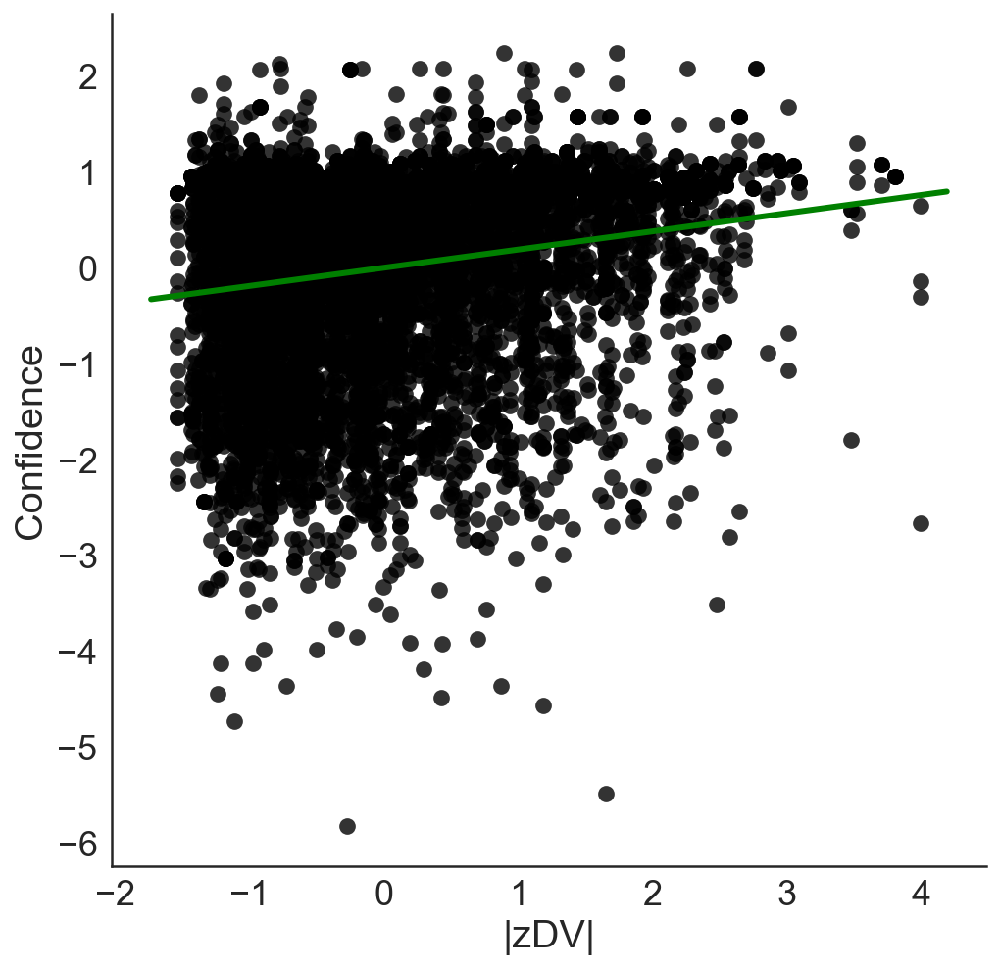

In [463]:
f = plt.figure(figsize=(8, 8))
sns.set(style='white', font_scale=1.8)
ax = sns.regplot(data=data_exp1, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
#sns.regplot(data=data_exp1, x='AbsDiffValue', y='Confidence', fit_reg=False, ci=0, color='Black', scatter_kws={'s':50})
ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
#exp1 = mpatches.Patch(color='#000000', label='Experiment c1')
#exp2 = mpatches.Patch(color='#AAAAAA', label='Experiment 2')
#plt.legend(handles=[exp1, exp2], loc=3)
x=data_exp1[x_variable]
y=data_exp1[y_variable]
fit = np.polyfit(x, y, deg=1)
future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
fit_fn = np.poly1d(fit)
future_fit = np.polyval(fit_fn, future)
ax.plot(future, future_fit, color='Green', lw=3)
sns.despine()

results = pearsonr(data_exp1[x_variable], data_exp1[y_variable])
print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))

Text(0.5,1,'Correlations Full Exp')

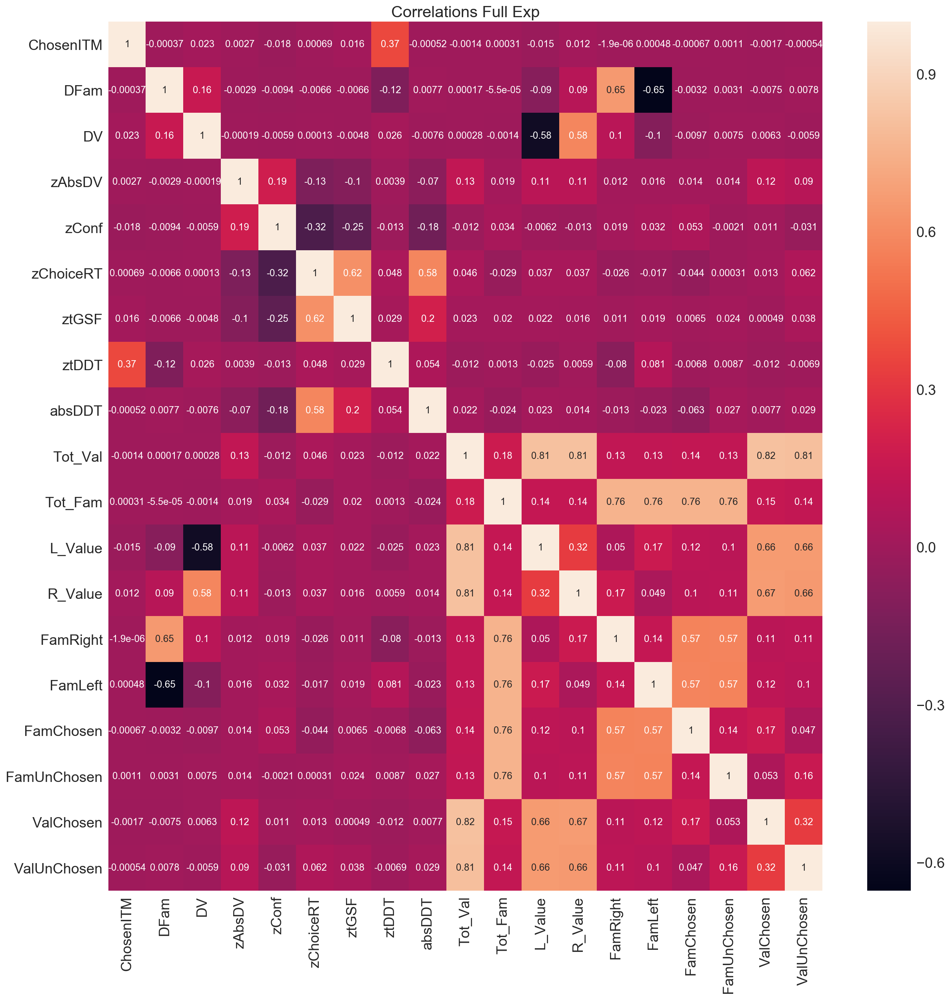

In [464]:
dataColsSelected = data_exp1.loc[:,  ['ChosenITM','DFam','DV','zAbsDV','zConf','zChoiceRT', 'ztGSF', 
                                     'ztDDT', 'absDDT', 'Tot_Val','Tot_Fam', 'L_Value','R_Value','FamRight','FamLeft', 
                                     'FamChosen','FamUnChosen','ValChosen', 'ValUnChosen']]
dataColsSelected
data_corr = dataColsSelected.corr(method='pearson')
data_corr
# plot the heatmap
fig, ax = plt.subplots(figsize=(20,20))         # Sample figsize in inches
sns.heatmap(data_corr, 
       xticklabels=data_corr.columns,
       yticklabels=data_corr.columns, annot=True, annot_kws={"size": 12})

ax.set_title('Correlations Full Exp',fontsize=20)
#sns.set(font_scale=0.8) 

## Like Condition Only

In [465]:
#Select Condition 
data_expL = data_exp1.loc[data_exp1['BlockCond'] == 1] # 1 = Like, 2 = Dislike


### Insert the variables to calculate the correlation

In [466]:
x_variable = 'zAbsDV'
x_varlabel = '|zDV|'
y_variable = 'zConf'
y_varlabel =  'Confidence'

Pearson's r = 0.192 p =  0.0


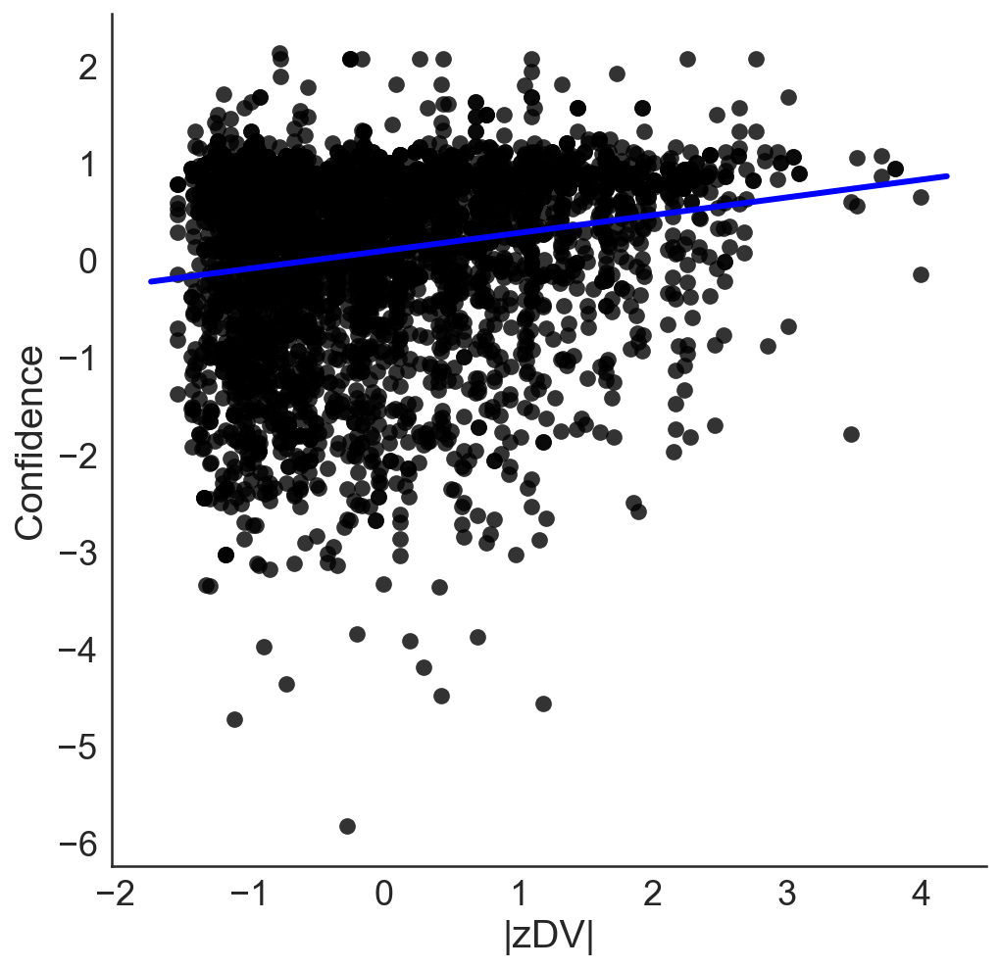

In [467]:
f = plt.figure(figsize=(8, 8))
sns.set(style='white', font_scale=1.8)
ax = sns.regplot(data=data_expL, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
#sns.regplot(data=data_exp1, x='AbsDiffValue', y='Confidence', fit_reg=False, ci=0, color='Black', scatter_kws={'s':50})
ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
#exp1 = mpatches.Patch(color='#000000', label='Experiment c1')
#exp2 = mpatches.Patch(color='#AAAAAA', label='Experiment 2')
#plt.legend(handles=[exp1, exp2], loc=3)
x=data_expL[x_variable]
y=data_expL[y_variable]
fit = np.polyfit(x, y, deg=1)
future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
fit_fn = np.poly1d(fit)
future_fit = np.polyval(fit_fn, future)
ax.plot(future, future_fit, color='Blue', lw=3)
sns.despine()

results = pearsonr(data_expL[x_variable], data_expL[y_variable])
print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))

Text(0.5,1,'Correlations Like Condition')

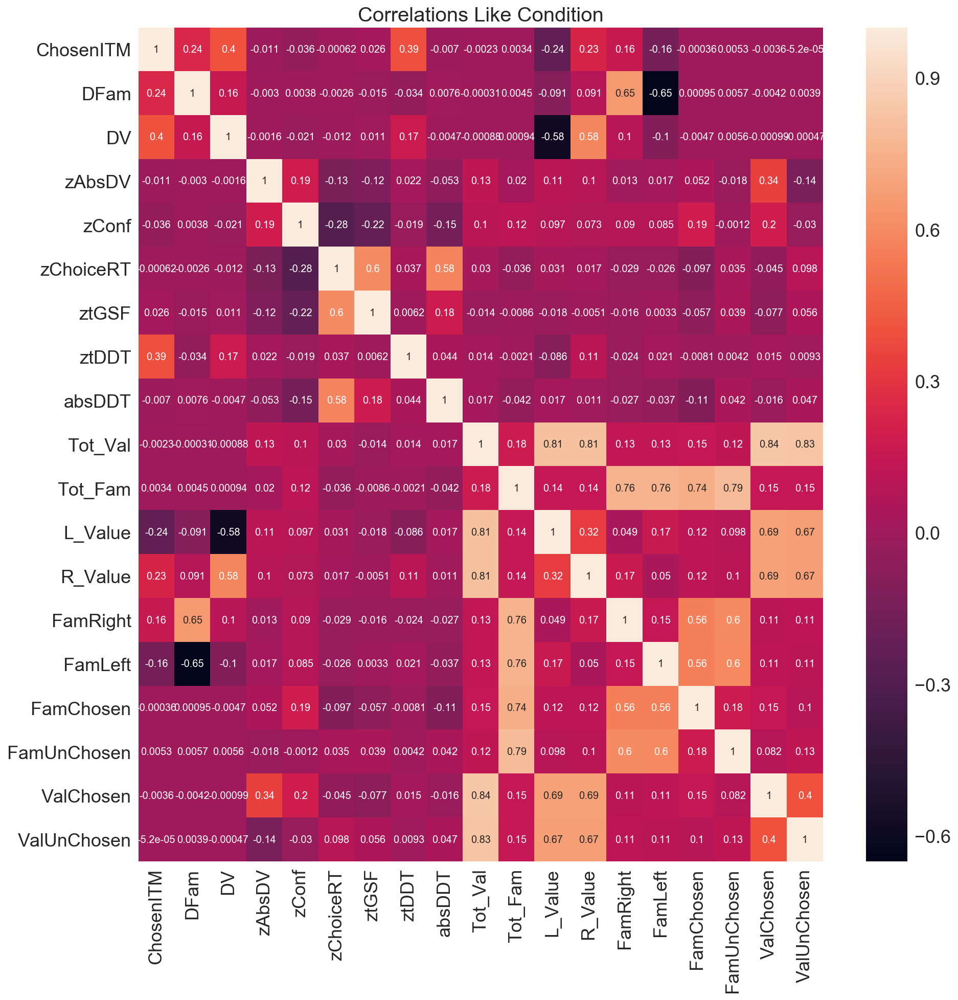

In [468]:
dataColsSelected = data_expL.loc[:, ['ChosenITM','DFam','DV','zAbsDV','zConf','zChoiceRT', 'ztGSF', 
                                     'ztDDT', 'absDDT', 'Tot_Val','Tot_Fam', 'L_Value','R_Value','FamRight','FamLeft', 
                                     'FamChosen','FamUnChosen','ValChosen', 'ValUnChosen']]
dataColsSelected
data_corr = dataColsSelected.corr(method='pearson')
data_corr
# plot the heatmap
fig, ax = plt.subplots(figsize=(15,15))         # Sample figsize in inches
sns.heatmap(data_corr, 
       xticklabels=data_corr.columns,
       yticklabels=data_corr.columns, annot=True, annot_kws={"size": 10})

ax.set_title('Correlations Like Condition',fontsize=20)

## Dislike Condition Only

In [469]:
data_expD = data_exp1.loc[data_exp1['BlockCond'] == 2] # 1 = Like, 2 = Dislike

### Insert the variables to calculate the correlation

In [470]:
x_variable = 'zAbsDV'
x_varlabel = '|zDV|'
y_variable = 'zConf'
y_varlabel =  'Confidence'

Pearson's r = 0.19 p =  0.0


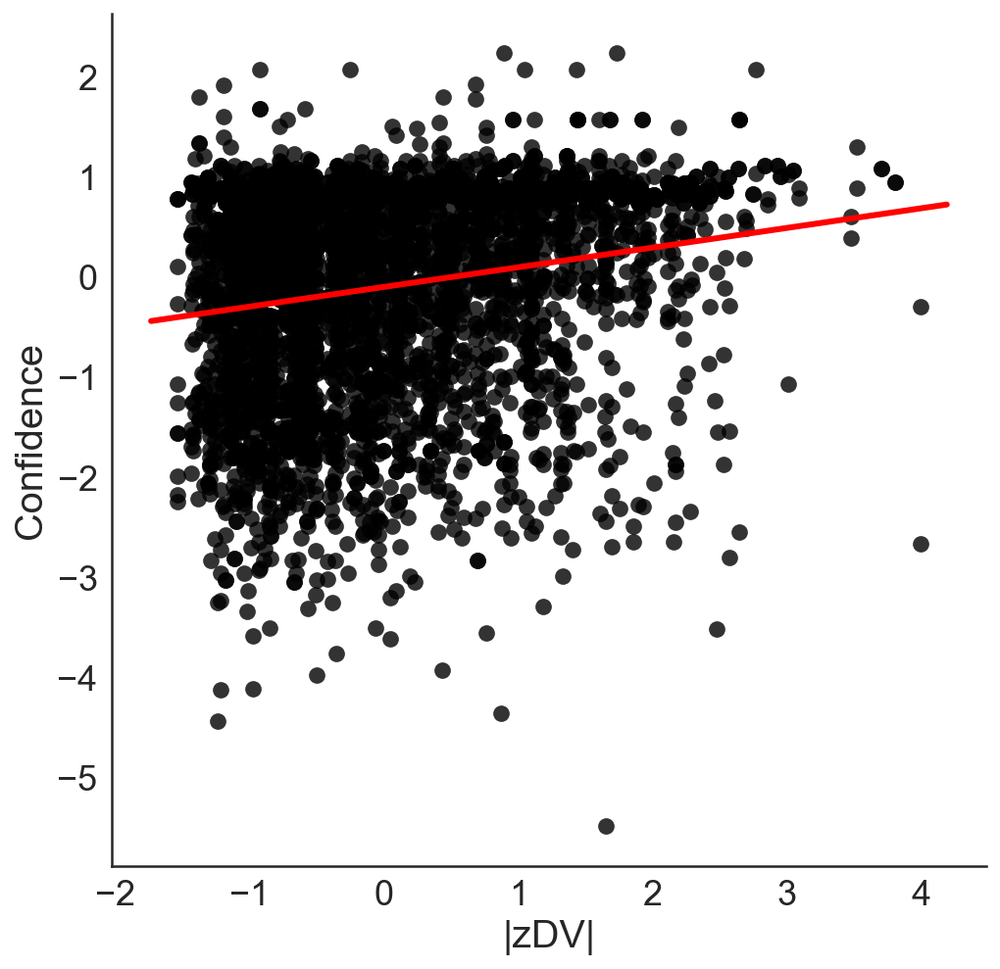

In [471]:
f = plt.figure(figsize=(8, 8))
sns.set(style='white', font_scale=1.8)
ax = sns.regplot(data=data_expD, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
#sns.regplot(data=data_exp1, x='AbsDiffValue', y='Confidence', fit_reg=False, ci=0, color='Black', scatter_kws={'s':50})
ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
#exp1 = mpatches.Patch(color='#000000', label='Experiment c1')
#exp2 = mpatches.Patch(color='#AAAAAA', label='Experiment 2')
#plt.legend(handles=[exp1, exp2], loc=3)
x=data_expD[x_variable]
y=data_expD[y_variable]
fit = np.polyfit(x, y, deg=1)
future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
fit_fn = np.poly1d(fit)
future_fit = np.polyval(fit_fn, future)
ax.plot(future, future_fit, color='Red', lw=3)
sns.despine()

results = pearsonr(data_expD[x_variable], data_expD[y_variable])
print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))

Text(0.5,1,'Correlations Dislike Condition')

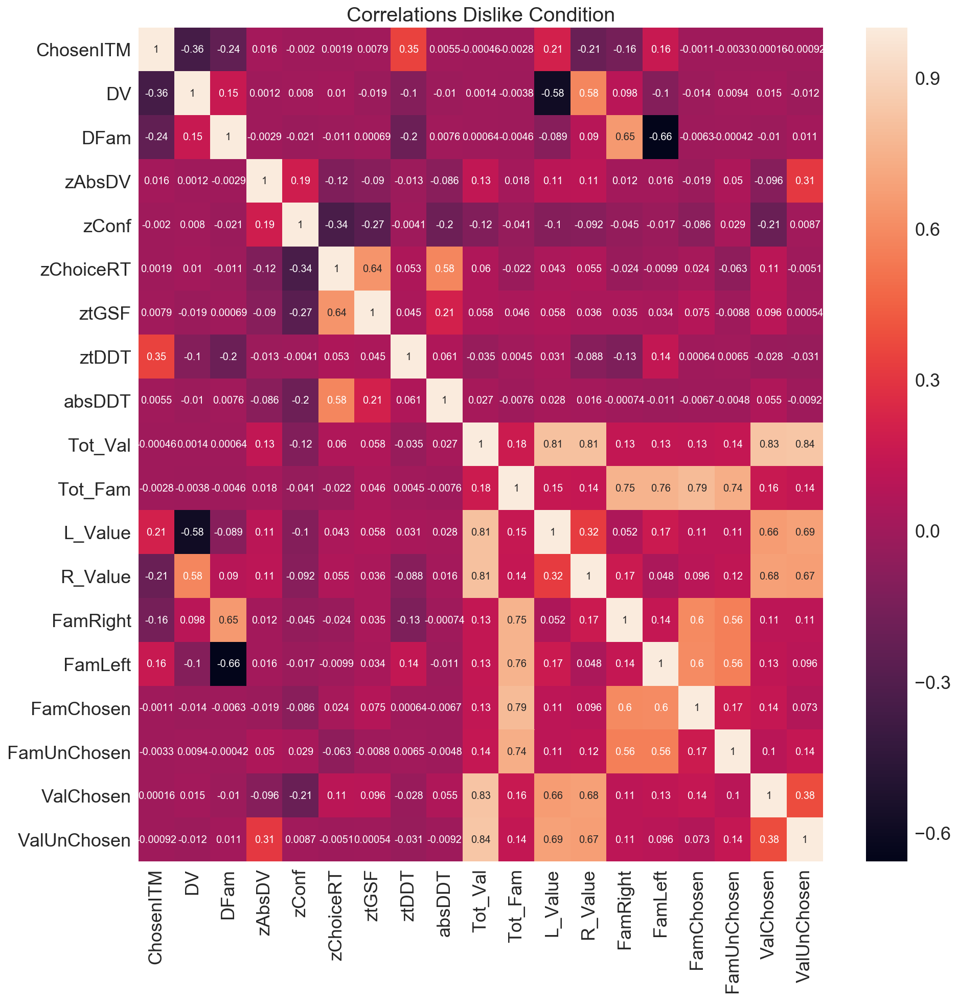

In [472]:
dataColsSelected = data_expD.loc[:, ['ChosenITM','DV','DFam','zAbsDV','zConf','zChoiceRT', 'ztGSF', 
                                     'ztDDT', 'absDDT', 'Tot_Val','Tot_Fam', 'L_Value','R_Value','FamRight','FamLeft', 
                                     'FamChosen','FamUnChosen','ValChosen', 'ValUnChosen']]
dataColsSelected
data_corr = dataColsSelected.corr(method='pearson')
data_corr
# plot the heatmap
fig, ax = plt.subplots(figsize=(15,15))         # Sample figsize in inches
sns.heatmap(data_corr, 
       xticklabels=data_corr.columns,
       yticklabels=data_corr.columns, annot=True, annot_kws={"size": 10})

ax.set_title('Correlations Dislike Condition',fontsize=20)

<a id='log'></a>
# 2. Logistic Plots

### Difference in value (DV) is calculated as (Value_Right  - Value_Left)

## Like Condition

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


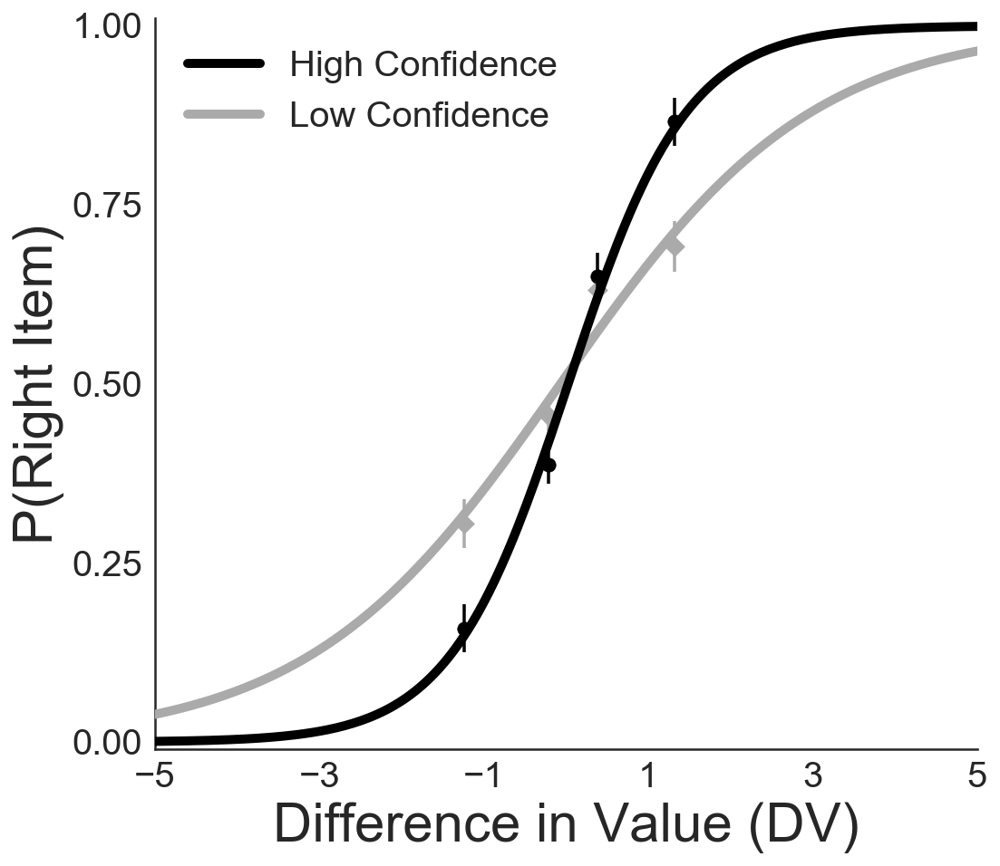

In [473]:
# Split by high/low conf
logisticplot_all('ConfSplit', 'High Confidence', 'Low Confidence', data=data_expL, xaxis='zDV', yaxis='ChosenITM', ylab='P(Right Item)', xlab='Difference in Value (DV)',
                 modhighcol='#000000', modlowcol='#AAAAAA', title='empty', parvar='Part')
plt.tight_layout()

#### TO DO:  Check the slopes 

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


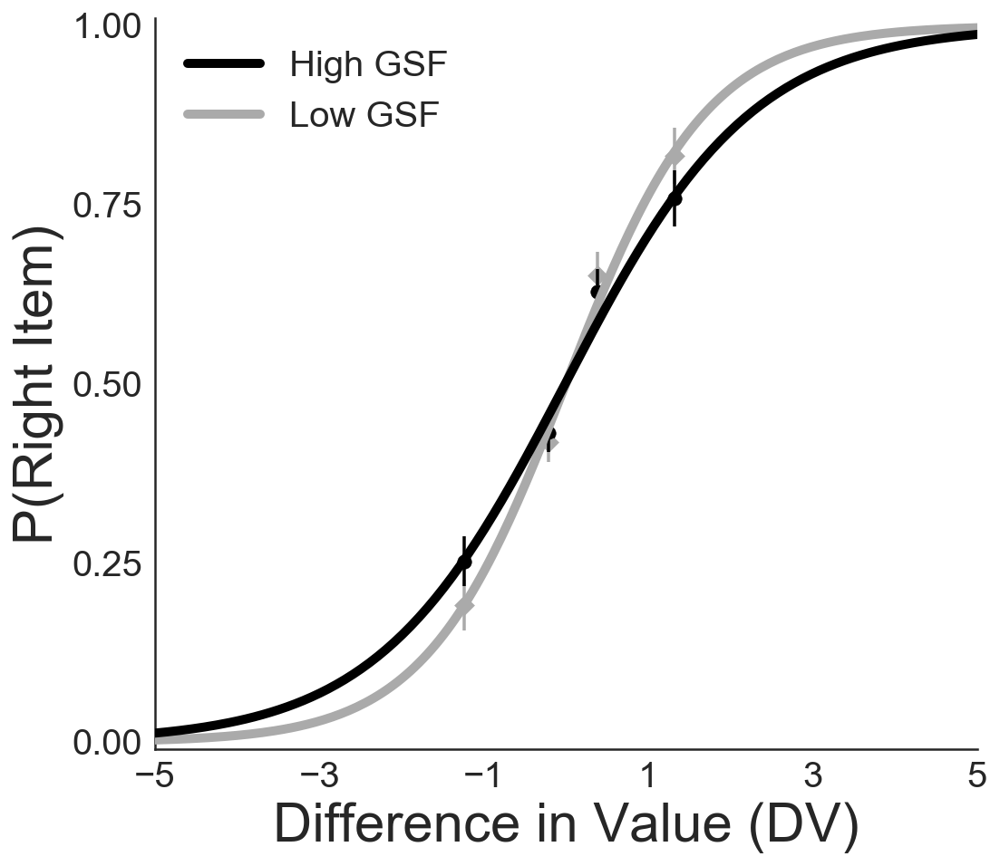

In [474]:
# Split by high/low gaze shift frequency
logisticplot_all('GSFMedSplit', 'High GSF', 'Low GSF', data=data_expL, xaxis='zDV', yaxis='ChosenITM', ylab='P(Right Item)', xlab='Difference in Value (DV)',
                 modhighcol='#000000', modlowcol='#AAAAAA', title='empty', parvar='Part')
plt.tight_layout()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


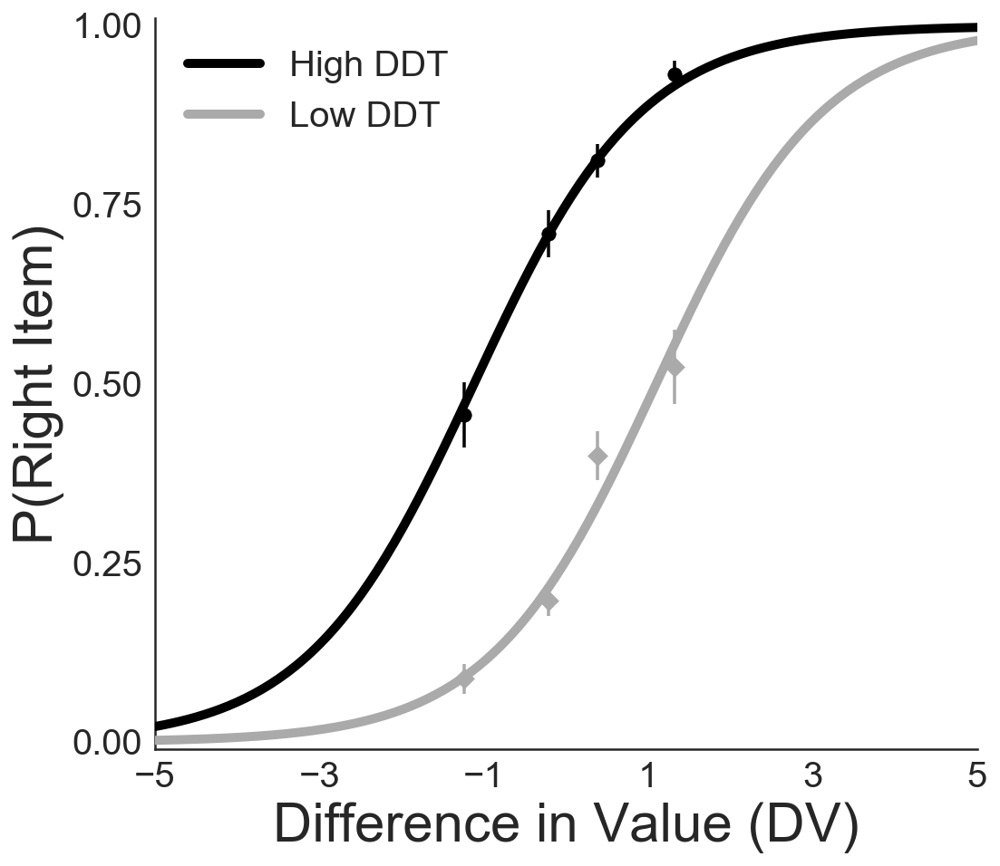

In [475]:
# Split by high/low dwelling time
logisticplot_all('DDTMedSplit', 'High DDT', 'Low DDT', data=data_expL, xaxis='zDV', yaxis='ChosenITM', ylab='P(Right Item)', xlab='Difference in Value (DV)',
                 modhighcol='#000000', modlowcol='#AAAAAA', title='empty', parvar='Part')
plt.tight_layout()

In [476]:
##absolute DDT
#logisticplot_all('absDDTMedSplit', 'High absDDT', 'Low absDDT', data=data_expL
#            , xaxis='zDV', yaxis='ChosenITM', ylab='P(Right Item)', xlab='Difference in Value (DV)',
#                 modhighcol='#000000', modlowcol='#AAAAAA', title='empty', parvar='Part')
#plt.tight_layout()

## Dislike Condition

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


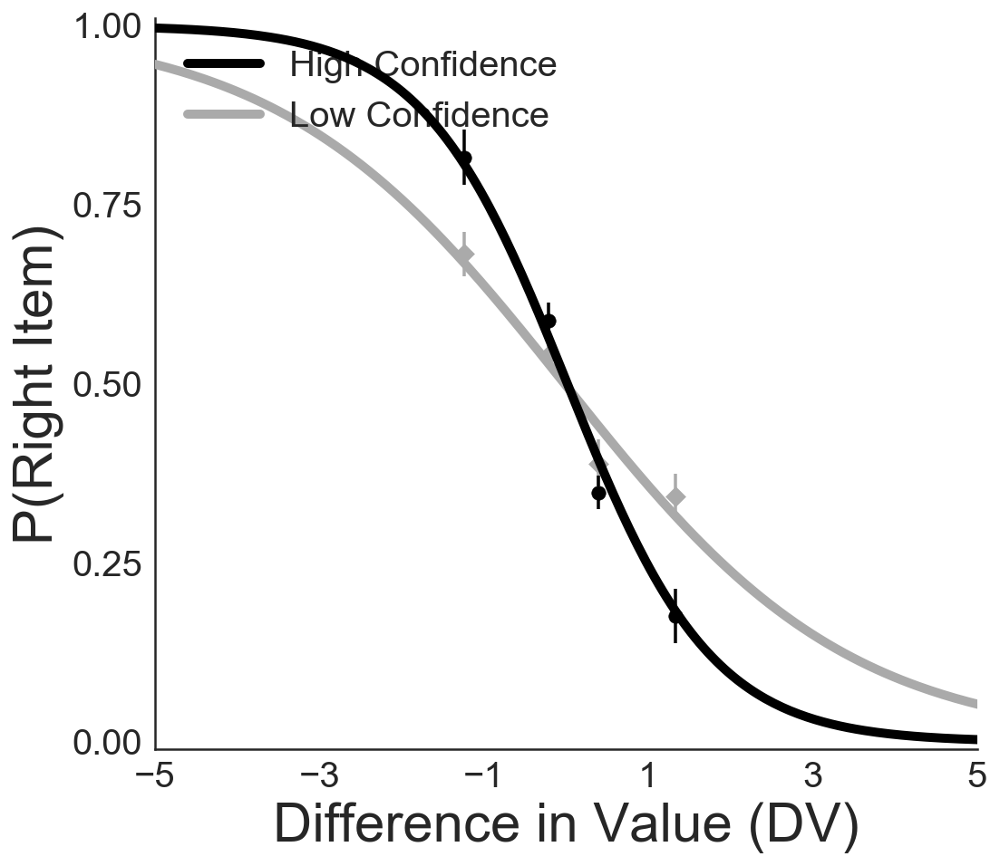

In [477]:
# Split by high/low conf
logisticplot_all('ConfSplit', 'High Confidence', 'Low Confidence', data=data_expD, xaxis='zDV', yaxis='ChosenITM', ylab='P(Right Item)', xlab='Difference in Value (DV)',
                 modhighcol='#000000', modlowcol='#AAAAAA', title='empty', parvar='Part')
plt.tight_layout()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


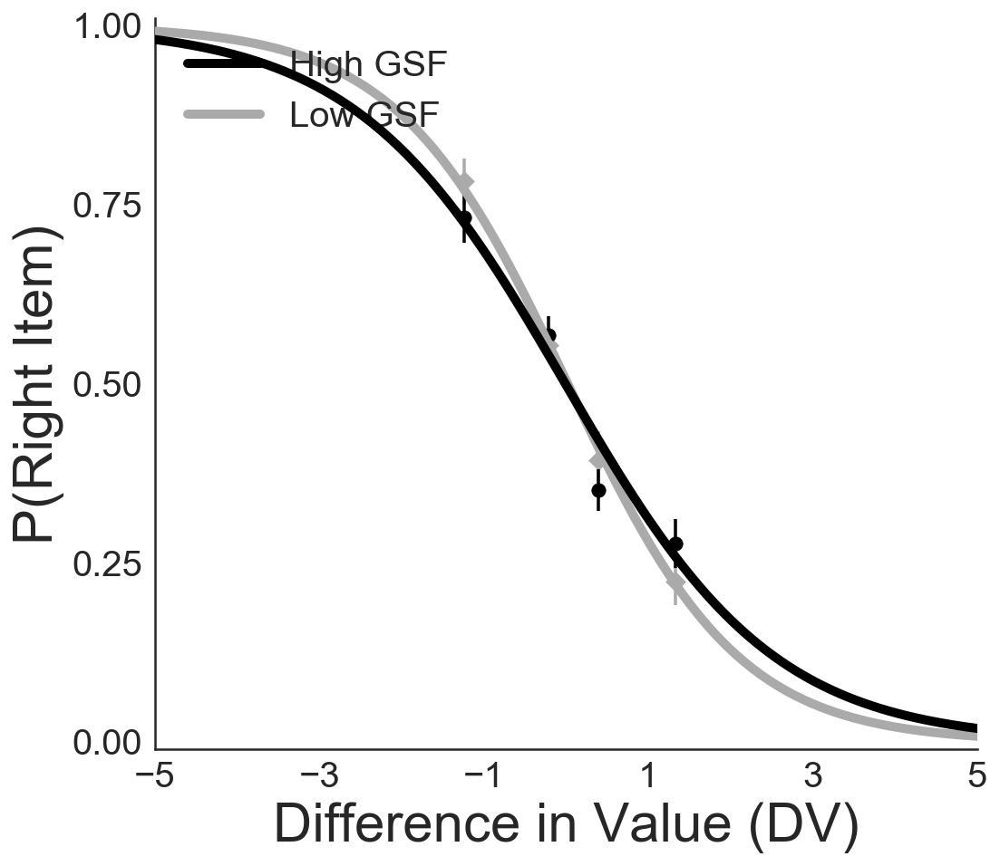

In [478]:
# Split by high/low gaze shift frequency
logisticplot_all('GSFMedSplit', 'High GSF', 'Low GSF', data=data_expD, xaxis='zDV', yaxis='ChosenITM', ylab='P(Right Item)', xlab='Difference in Value (DV)',
                 modhighcol='#000000', modlowcol='#AAAAAA', title='empty', parvar='Part')
plt.tight_layout()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


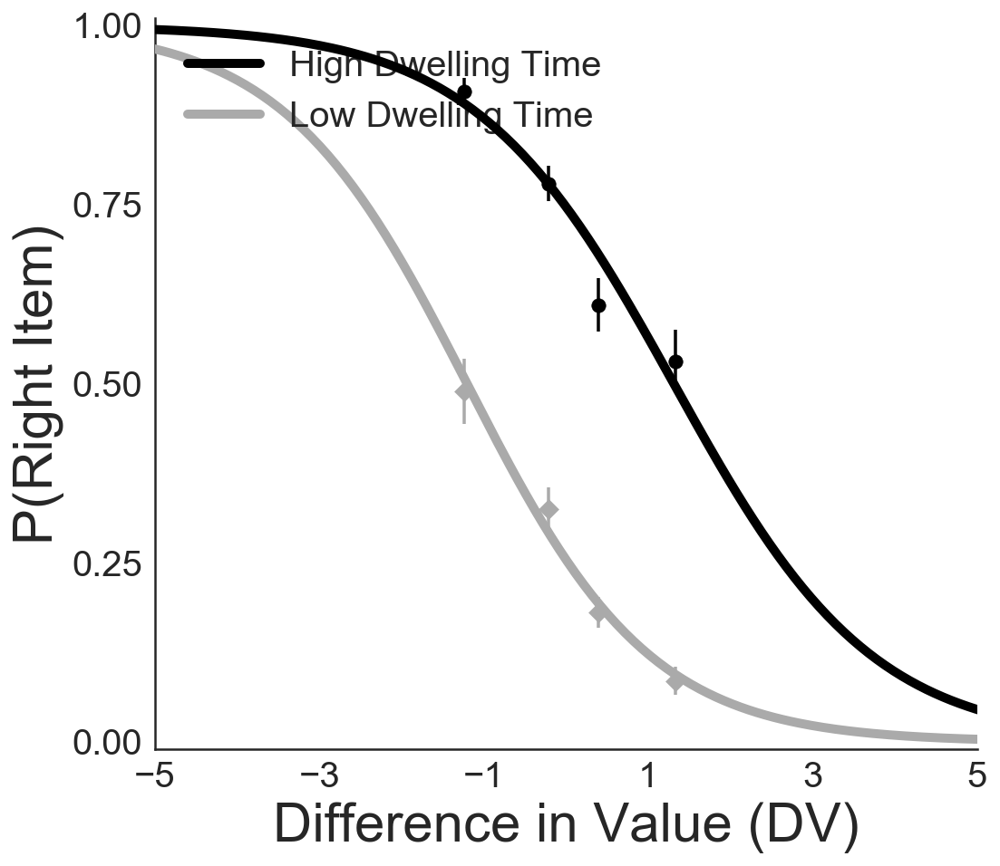

In [479]:
# Split by high/low dwelling time
logisticplot_all('DDTMedSplit', 'High Dwelling Time', 'Low Dwelling Time', data=data_expD, xaxis='zDV', yaxis='ChosenITM', ylab='P(Right Item)', xlab='Difference in Value (DV)',
                 modhighcol='#000000', modlowcol='#AAAAAA', title='empty', parvar='Part')
plt.tight_layout()

<a id='reg'></a>
# 3. Regression Analysis
 

## Loading data in R

In [480]:
%R -i data_exp1
data_exp1

,Part,TrialN,PairID,L_Item,L_Value,R_Item,R_Value,ChosenITM,ChoiceRT,Conf,...,ZValUnCh,ZFamCh,ZFamUnCh,ztGSF,ztDDT,absDDT,abszDFam,ConfSplit,GSFMedSplit,DDTMedSplit
0,1,1,14,116_boots_caramels.png,0.95,31_beef_jerky.png,2.00,1,3327,72,...,-1.231099,0.729319,-1.870111,0.358023,-1.801757,1.801757,2.003022e+00,1,1,0
1,1,2,44,102_propercorn_worcester.png,2.30,26_yorkie.png,1.70,1,3424,68,...,1.783838,-0.167275,0.736154,0.358023,1.145403,1.145403,6.676741e-01,0,1,1
2,1,3,51,59_crunchie.png,1.70,5_caramello.png,1.25,1,3691,68,...,0.443866,-0.705231,0.854305,-1.136333,1.970934,1.970934,1.159082e+00,0,0,1
3,1,4,12,64_nestle_aero_mint.png,1.55,102_propercorn_worcester.png,2.30,0,8144,68,...,1.783838,0.851256,0.736154,1.105201,-1.993893,1.993893,9.080368e-02,0,1,0
4,1,5,4,44_walkers_french_fries.png,2.00,111_propercorn_sweetnsalty.png,2.00,0,6559,88,...,1.113852,0.370682,0.854305,1.105201,-2.140437,2.140437,3.578733e-01,1,1,0
5,1,6,39,50_nakd_rhubarb_and_custard.png,0.65,39_milkyway.png,1.25,0,5595,86,...,-0.561113,-2.735119,0.214901,0.358023,-3.526091,3.526091,2.179288e+00,1,1,0
6,1,7,59,54_milkyway_magic_stars.png,1.55,30_starburst_original.png,1.10,1,2470,78,...,0.108873,0.729319,0.854305,-1.136333,1.348937,1.348937,9.080368e-02,1,0,1
7,1,8,16,116_boots_caramels.png,0.95,104_graze_sriracha.png,0.65,1,6091,72,...,-1.231099,-2.498419,-1.870111,-0.389155,2.394283,2.394283,4.006045e-01,1,0,1
8,1,9,1,62_cadbury_wispa.png,1.55,47_daim.png,1.70,1,4669,68,...,0.108873,0.012044,-0.306352,0.358023,1.344052,1.344052,2.670697e-01,0,1,1
9,1,10,48,44_walkers_french_fries.png,2.00,53_eat_natural_almond_apricot.png,1.10,1,4001,66,...,1.113852,0.370682,0.388652,-1.136333,3.649676,3.649676,7.906850e-18,0,0,1


In [481]:
%%R
#Change Column name for better regression presentation
colnames(data_exp1)[which(names(data_exp1) == "zChoiceRT")] <- "zRT"
colnames(data_exp1)[which(names(data_exp1) == "ChoiceRT")] <- "RT"
colnames(data_exp1)[which(names(data_exp1) == "ztDDT")] <- "zDDT"
colnames(data_exp1)[which(names(data_exp1) == "ztGSF")] <- "zGSF"

In [482]:
%%R
# Separating the data for both conditions 
data_exp1_Like <- data_exp1[ which(data_exp1$BlockCond=='1'), ]
data_exp1_DisLike <- data_exp1[ which(data_exp1$BlockCond=='2'), ]

## Comparing groups mean per condition 

[1] "T-test for RT across groups "

	Welch Two Sample t-test

data:  data_exp1_Like[["RT"]] and data_exp1_DisLike[["RT"]]
t = -7.1367, df = 7783.8, p-value = 1.042e-12
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -420.0066 -238.9954
sample estimates:
mean of x mean of y 
 2823.373  3152.874 

[1] "T-test for CONFIDENCE across groups "

	Welch Two Sample t-test

data:  data_exp1_Like[["Conf"]] and data_exp1_DisLike[["Conf"]]
t = 8.3201, df = 7788.3, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 3.701523 5.983325
sample estimates:
mean of x mean of y 
 76.81667  71.97424 



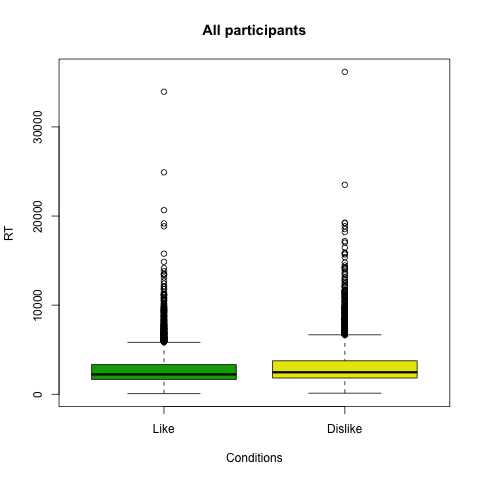

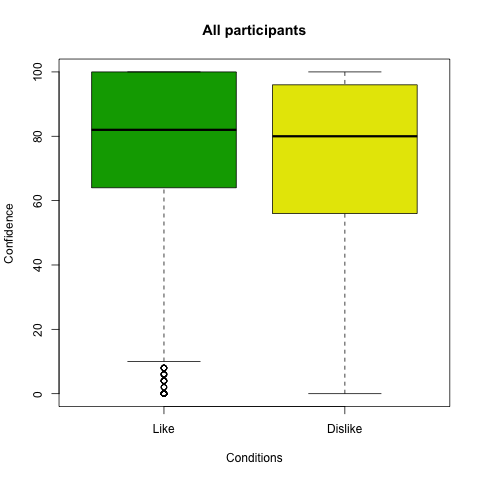

In [483]:
%%R
#Checking that RT and confidence levels are similar across conditions (like-dislike)
MeanLikeRT = mean(data_exp1_Like[["RT"]])
MeanDislikeRT = mean(data_exp1_DisLike[["RT"]])

MeanLikeConf = mean(data_exp1_Like[["Conf"]])
MeanDislikeConf = mean(data_exp1_DisLike[["Conf"]])

p_rt = t.test(data_exp1_Like[["RT"]],data_exp1_DisLike[["RT"]])
p_conf = t.test(data_exp1_Like[["Conf"]],data_exp1_DisLike[["Conf"]])

#Generate boxpot for Reaction time per condition
boxplot(data_exp1$RT ~ data_exp1$BlockCond , col=terrain.colors(4), names=c("Like","Dislike"))
title(main="All participants", 
   xlab="Conditions", ylab="RT")

#Generate boxpot for Confidence per condition
boxplot(data_exp1$Conf ~ data_exp1$BlockCond , col=terrain.colors(4), names=c("Like","Dislike"))
title(main="All participants", 
   xlab="Conditions", ylab="Confidence")

## Add data points
#mylevels<-levels(data_exp1$BlockCond)
#levelProportions<-summary(data_exp1$BlockCond)/nrow(data_exp1)
#for(i in 1:length(mylevels)){
#  thislevel<-mylevels[i]
#  thisvalues<-data_exp1[data_exp1$BlockCond==thislevel, "RT"]

#   # take the x-axis indices and add a jitter, proportional to the N in each level
#  myjitter<-jitter(rep(i, length(thisvalues)), amount=levelProportions[i]/2)
#  points(myjitter, thisvalues, pch=20, col=rgb(0,0,0,.2))  
#}

print("T-test for RT across groups ")
print(p_rt)

print("T-test for CONFIDENCE across groups ")
print( p_conf)

<a id='regCond'></a>
# 3.1.  Regressions per Condition (Like/Dislike)
## ChoiceITM~ BehavioralParams + DDT

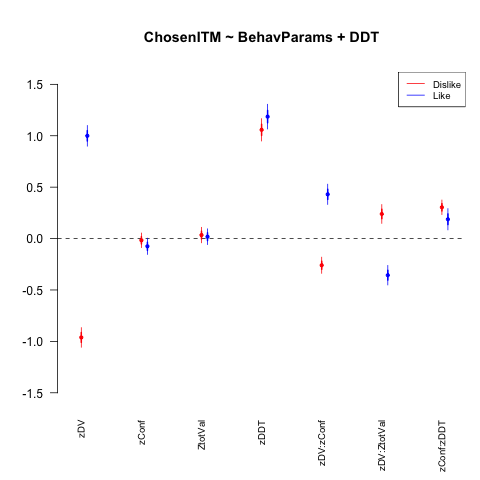

In [546]:
%%R
# Figure replicating Folke 2016.

ModelChoiceL_1 <- glm(ChosenITM ~ zDV + zConf + ZtotVal + zDV:zConf + zDV:ZtotVal + zDDT + zConf:zDDT, data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_1 <- glm(ChosenITM ~ zDV + zConf + ZtotVal + zDV:zConf + zDV:ZtotVal + zDDT + zConf:zDDT, data=data_exp1_DisLike, family=binomial(link="logit"))

coefplot(ModelChoiceD_1,intercept=FALSE,vertical = FALSE,  col.pts="red", mar = c(3,4,5,1) ,ylim=c(-1.5, 1.5) ,main="ChosenITM ~ BehavParams + DDT")
coefplot(ModelChoiceL_1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue",mar = c(3,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=0.8)

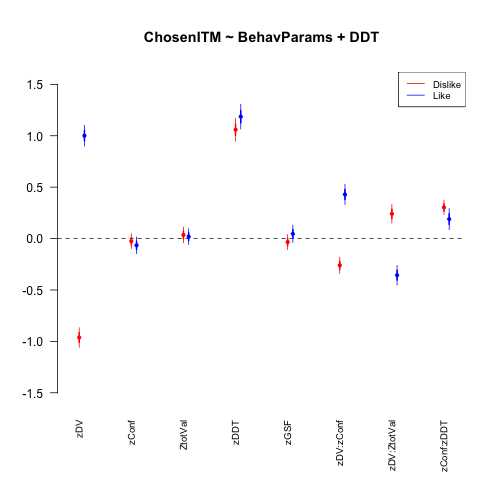

In [487]:
%%R
# Figure replicating Folke 2016.

ModelChoiceL_2 <- glm(ChosenITM ~ zDV + zConf + ZtotVal + zDV:zConf + zDV:ZtotVal + zDDT + zGSF + zConf:zDDT, data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_2 <- glm(ChosenITM ~ zDV + zConf + ZtotVal + zDV:zConf + zDV:ZtotVal + zDDT + zGSF + zConf:zDDT, data=data_exp1_DisLike, family=binomial(link="logit"))

coefplot(ModelChoiceD_2,intercept=FALSE,vertical = FALSE,  col.pts="red", mar = c(3,4,5,1) ,ylim=c(-1.5, 1.5) ,main="ChosenITM ~ BehavParams + DDT")
coefplot(ModelChoiceL_2, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue",mar = c(3,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=0.8)

### Confidence ~ BehavParams + GSF

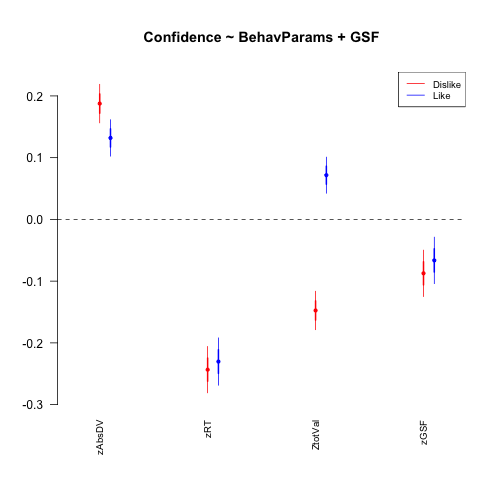

In [493]:
%%R
# Figure replicating Folke 2016. 

ModelConfidenceL_1 <- glm(zConf ~ zAbsDV + zRT  + ZtotVal + zGSF , data=data_exp1_Like)
ModelConfidenceD_1 <- glm(zConf ~ zAbsDV + zRT + ZtotVal + zGSF , data=data_exp1_DisLike)

#summary(logitMod_FF2017)
#summary(logitModLike_FF2017)
#summary(logitModUnlike_FF2017)

coefplot(ModelConfidenceD_1,intercept=FALSE, vertical = FALSE, col.pts="red", offset = 0.05, mar = c(3,4,5,1) ,main="Confidence ~ BehavParams + GSF")
coefplot(ModelConfidenceL_1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue",mar = c(3,4,5,1),main="RegEstim")
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=0.8)

### Choice ~ ValueChosen + ValueUnChosen + Confidence + TotalValue + DDT +(interactions)


Call:
glm(formula = ChosenITM ~ -1 + ZValCh + ZValUnCh + zConf + ZtotVal + 
    zDDT, family = binomial(link = "logit"), data = data_exp1_Like)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-3.3297  -0.9897   0.0516   1.0305   4.3656  

Coefficients:
         Estimate Std. Error z value Pr(>|z|)    
ZValCh    0.57829    0.74950   0.772   0.4404    
ZValUnCh  0.55111    0.74223   0.743   0.4578    
zConf    -0.07143    0.03866  -1.847   0.0647 .  
ZtotVal  -0.78839    1.05062  -0.750   0.4530    
zDDT      1.27739    0.05704  22.395   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

(Dispersion parameter for binomial family taken to be 1)

    Null deviance: 5489.7  on 3960  degrees of freedom
Residual deviance: 4721.2  on 3955  degrees of freedom
AIC: 4731.2

Number of Fisher Scoring iterations: 4



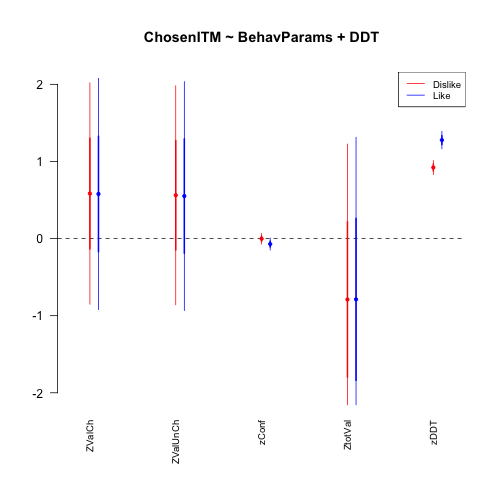

In [523]:
%%R
# 
#ModelChoiceL_3 <- glm(ChosenITM ~ -1 + ZValCh + ZValUnCh + zConf + ZtotVal + ZValCh:zConf + ZValCh:ZtotVal 
#                               + ZValUnCh:zConf + ZValUnCh:ZtotVal + zDDT + zConf:zDDT, data=data_exp1_Like, family=binomial(link="logit"))
#ModelChoiceD_3 <- glm(ChosenITM ~ -1 + ZValCh + ZValUnCh + zConf + ZtotVal + ZValCh:zConf + ZValCh:ZtotVal 
#                               + ZValUnCh:zConf + ZValUnCh:ZtotVal + zDDT + zConf:zDDT, data=data_exp1_DisLike, family=binomial(link="logit"))


ModelChoiceL_3 <- glm(ChosenITM ~ -1 + ZValCh + ZValUnCh + zConf + ZtotVal+ zDDT , data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_3 <- glm(ChosenITM ~ -1 + ZValCh + ZValUnCh + zConf + ZtotVal + zDDT , data=data_exp1_DisLike, family=binomial(link="logit"))

print(summary(ModelChoiceL_3))

coefplot(ModelChoiceD_3,intercept=FALSE,vertical = FALSE,  col.pts="red", mar = c(3,4,5,1) ,ylim=c(-2.0, 2.0) ,main="ChosenITM ~ BehavParams + DDT")
coefplot(ModelChoiceL_3, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue",mar = c(3,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=0.8)

### Confidence ~ ReactionTime + ValueChosen + ValueUnChosen + TotalValue + GSF

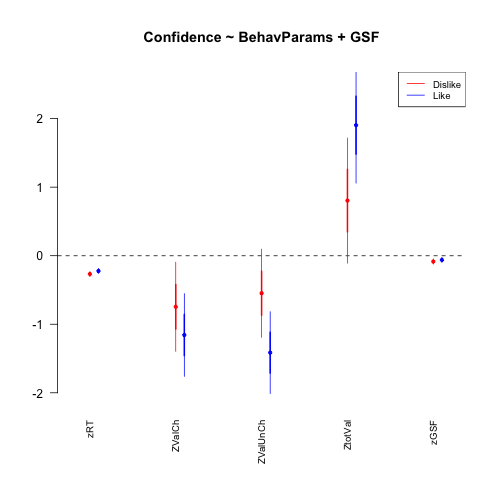

In [490]:
%%R
# 
ModelConfidenceL_2 <- glm(zConf ~ -1 + zRT + ZValCh + ZValUnCh  + ZtotVal + zGSF, data=data_exp1_Like)
ModelConfidenceD_2 <- glm(zConf ~ -1 + zRT + ZValCh + ZValUnCh  + ZtotVal + zGSF, data=data_exp1_DisLike)

coefplot(ModelConfidenceD_2,intercept=FALSE,vertical = FALSE,  col.pts="red", mar = c(3,4,5,1) ,ylim=c(-2.0, 2.5) ,main="Confidence ~ BehavParams + GSF")
coefplot(ModelConfidenceL_2, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue",mar = c(3,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=0.8)

<a id='regPart'></a>
# 3.2. Generate regression plots for condition and individual participants 
## ChoiceITM~ BehavioralParams + DDT

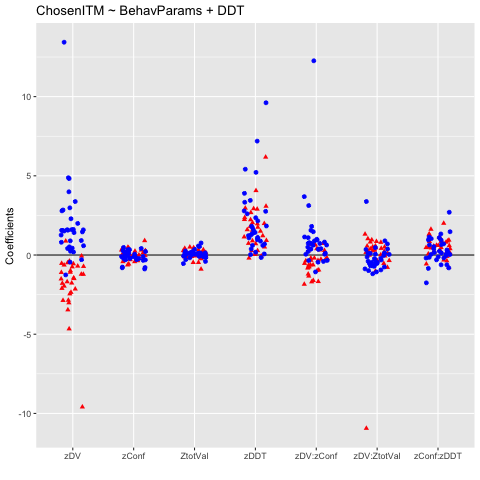

In [547]:
%%R
#Generate regression plots for individual participants 
#ChoiceITM~ BehavioralParams + DDT

#Run for all the participants

# Extract values for LIKE Regression
#Initialize the matrix
partCoefs <- matrix(, nrow = 0, ncol = 7)
for (i in unique(data_exp1_Like[,"Part"])){
data_rgrs_subj  <- data_exp1_Like[ which(data_exp1_Like$Part==i), ]
rsults <- glm(ChosenITM ~ zDV + zConf + ZtotVal + zDV:zConf + zDV:ZtotVal + zDDT + zConf:zDDT, data=data_rgrs_subj, family=binomial(link="logit"))
partCoefs <- rbind(partCoefs,summary(rsults)$coefficients[2:8])      
}

#transform coefficiencts by participant vector to dataframe
CoefsDataFrameLike <- data.frame(partCoefs)
#extract the name of the coefficients
a <- names (rsults$coefficients)
#replace names for coefficients in dataframe
for (j in 2: length(a)){
colnames(CoefsDataFrameLike)[j-1] <- a[j]
}
CoefsDataFrameLike

# Extract values for DISLIKE Regression
#Initialize the matrix
partCoefs <- matrix(, nrow = 0, ncol = 7)
for (i in unique(data_exp1_DisLike[,"Part"])){
data_rgrs_subj  <- data_exp1_DisLike[ which(data_exp1_DisLike$Part==i), ]
rsults <- glm(ChosenITM ~ zDV + zConf + ZtotVal + zDV:zConf + zDV:ZtotVal + zDDT + zConf:zDDT, data=data_rgrs_subj, family=binomial(link="logit"))
partCoefs <- rbind(partCoefs,summary(rsults)$coefficients[2:8])      
}
#transform coefficiencts by participant vector to dataframe
CoefsDataFrameDislike <- data.frame(partCoefs)
#extract the name of the coefficients
a <- names (rsults$coefficients)
#replace names for coefficients in dataframe
for (j in 2: length (a)){
colnames(CoefsDataFrameDislike)[j-1] <- a[j]
}
CoefsDataFrameDislike

jitter <- position_jitter(width = 0.2)
plot2 <- ggplot()  + geom_hline(yintercept = 0) + 
      geom_point(data = melt(CoefsDataFrameDislike),aes(x=variable, y=value), shape = 17, color='red', position = jitter) +
      geom_point(data = melt(CoefsDataFrameLike), aes(x=variable, y=value),color='blue', position = jitter) + labs(x = "", y = "Coefficients") +
      ggtitle("ChosenITM ~ BehavParams + DDT") + theme(legend.position="Top") 

#save as an image
ggsave("Output/Choice_Reg_Participant.tiff", units="in", width=6, height=4, dpi=300, compression = 'lzw')
plot2

### Different colors by participant

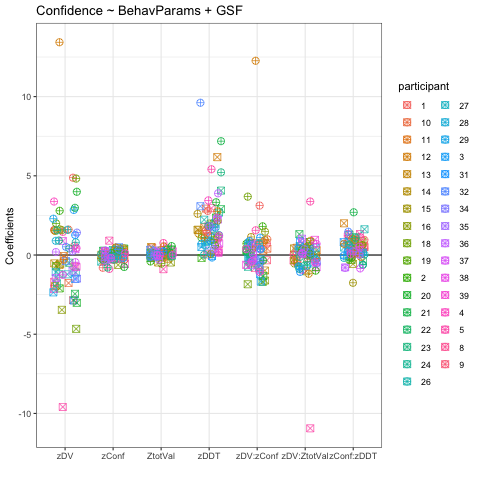

In [533]:
%%R
CoefsDataFrameLike <- melt(CoefsDataFrameLike)
CoefsDataFrameDislike <- melt(CoefsDataFrameDislike)

CoefsDataFrameLike$participant      <- as.character(rep(unique(data_exp1_Like[,"Part"]), length (a)-1))
CoefsDataFrameDislike$participant<- as.character(rep(unique(data_exp1_DisLike[,"Part"]), length (a)-1))

jitter <- position_jitter(width = 0.25)
plot2 <- ggplot()  + geom_hline(yintercept = 0) + 
      geom_point(data = CoefsDataFrameDislike,aes(x=variable, y=value, colour =participant ), shape = 7,size = 3, position = jitter,show.legend = TRUE) +
      geom_point(data = CoefsDataFrameLike, aes(x=variable, y=value, colour = participant), shape = 10, position = jitter,size = 3,,show.legend = TRUE)  +
      labs(x = "", y = "Coefficients") + 
      ggtitle("Confidence ~ BehavParams + GSF")+
      theme_bw()
#save as an image
ggsave("Output/Choice_Reg_ParticipantColors.tiff", units="in", width=8, height=4, dpi=300, compression = 'lzw')

plot2

## Confidence ~ ValueChosen + ValueUnchose + extras

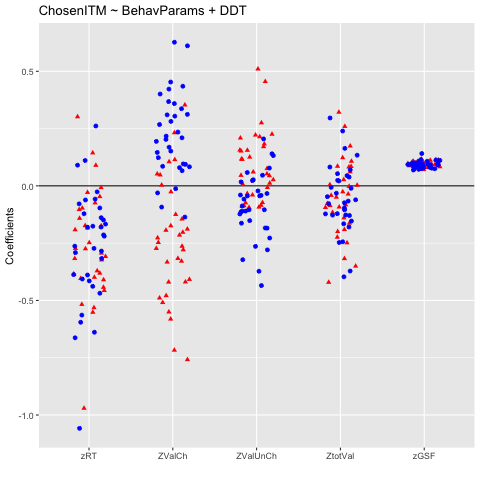

In [541]:
%%R
#Generate regression plots for individual participants 
#ChoiceITM~ BehavioralParams + DDT

#Run for all the participants

# Extract values for LIKE Regression
#Initialize the matrix

partCoefs <- matrix(, nrow = 0, ncol = 5)
for (i in unique(data_exp1_Like[,"Part"])){
data_rgrs_subj  <- data_exp1_Like[ which(data_exp1_Like$Part==i), ]
rsults <- glm(zConf ~ zRT + ZValCh + ZValUnCh  + ZtotVal + zGSF, data=data_rgrs_subj)
partCoefs <- rbind(partCoefs,summary(rsults)$coefficients[2:6])      
}

#transform coefficiencts by participant vector to dataframe
CoefsDataFrameLike <- data.frame(partCoefs)
#extract the name of the coefficients
a <- names (rsults$coefficients)
#replace names for coefficients in dataframe
for (j in 2: length(a)){
colnames(CoefsDataFrameLike)[j-1] <- a[j]
}
CoefsDataFrameLike

# Extract values for DISLIKE Regression
#Initialize the matrix
partCoefs <- matrix(, nrow = 0, ncol = 5)
for (i in unique(data_exp1_DisLike[,"Part"])){
data_rgrs_subj  <- data_exp1_DisLike[ which(data_exp1_DisLike$Part==i), ]
rsults <- glm(zConf ~ zRT + ZValCh + ZValUnCh  + ZtotVal + zGSF, data=data_rgrs_subj)
partCoefs <- rbind(partCoefs,summary(rsults)$coefficients[2:6])      
}
#transform coefficiencts by participant vector to dataframe
CoefsDataFrameDislike <- data.frame(partCoefs)
#extract the name of the coefficients
a <- names (rsults$coefficients)
#replace names for coefficients in dataframe
for (j in 2: length (a)){
colnames(CoefsDataFrameDislike)[j-1] <- a[j]
}
CoefsDataFrameDislike

jitter <- position_jitter(width = 0.2)
plot2 <- ggplot()  + geom_hline(yintercept = 0) + 
      geom_point(data = melt(CoefsDataFrameDislike),aes(x=variable, y=value), shape = 17, color='red', position = jitter) +
      geom_point(data = melt(CoefsDataFrameLike), aes(x=variable, y=value),color='blue', position = jitter) + labs(x = "", y = "Coefficients") +
      ggtitle("ChosenITM ~ BehavParams + DDT") + theme(legend.position="Top") 

#save as an image
ggsave("Output/Choice_Reg_Participant.tiff", units="in", width=6, height=4, dpi=300, compression = 'lzw')
plot2

### Different colors by participant

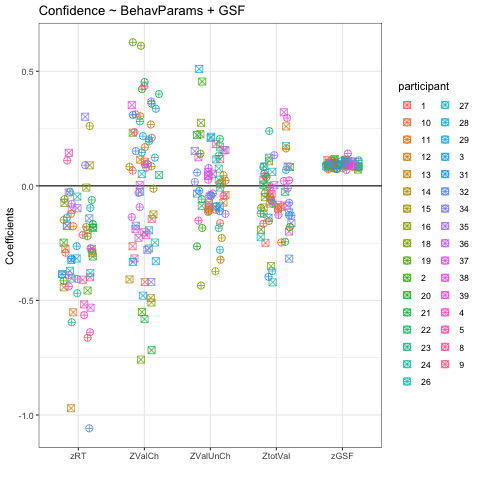

In [535]:
%%R
CoefsDataFrameLike <- melt(CoefsDataFrameLike)
CoefsDataFrameDislike <- melt(CoefsDataFrameDislike)

CoefsDataFrameLike$participant      <- as.character(rep(unique(data_exp1_Like[,"Part"]), length (a)-1))
CoefsDataFrameDislike$participant<- as.character(rep(unique(data_exp1_DisLike[,"Part"]), length (a)-1))

jitter <- position_jitter(width = 0.25)
plot2 <- ggplot()  + geom_hline(yintercept = 0) + 
      geom_point(data = CoefsDataFrameDislike,aes(x=variable, y=value, colour =participant ), shape = 7,size = 3, position = jitter,show.legend = TRUE) +
      geom_point(data = CoefsDataFrameLike, aes(x=variable, y=value, colour = participant), shape = 10, position = jitter,size = 3,,show.legend = TRUE)  +
      labs(x = "", y = "Coefficients") + 
      ggtitle("Confidence ~ BehavParams + GSF")+
      theme_bw()
#save as an image
ggsave("Output/Choice_Reg_ParticipantColors.tiff", units="in", width=8, height=4, dpi=300, compression = 'lzw')

plot2

In [524]:
 
jitter <- position_jitter(width = 0.25)
plot2 <- ggplot()  + geom_hline(yintercept = 0) + 
       geom_point(data = CoefsDataFrameDislike,aes(x=variable, y=value, colour =participant ), shape = 7,size = 3, position = jitter,show.legend = TRUE) +
       geom_point(data = CoefsDataFrameLike, aes(x=variable, y=value, colour = participant), shape = 10, position = jitter,size = 3,,show.legend = TRUE)  +
       labs(x = "", y = "Coefficients") + 
       ggtitle("ChosenITM ~ BehavParams + DDT")+
       theme_bw()
 #save as an image
ggsave("Output/Choice_Reg_ParticipantColors.tiff", units="in", width=8, height=4, dpi=300, compression = 'lzw')
 
plot2


Error in `$<-.data.frame`(`*tmp*`, participant, value = c("1", "2", "3",  : 
  replacement has 165 rows, data has 231


## Confidence ~ ReactionTime + ValueChosen + ValueUnChosen + TotalValue + GSF

## Confidence ~ BehavParams + GSF

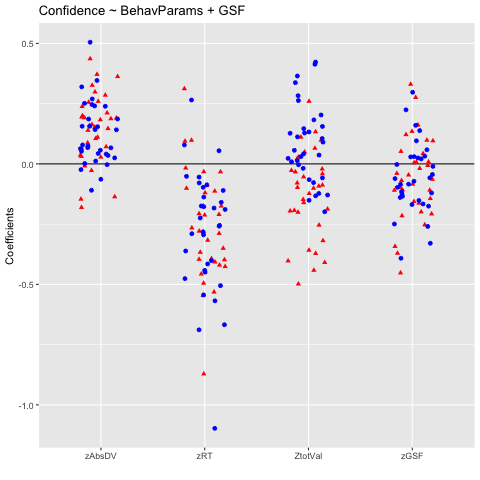

In [81]:
%%R

#Generate regression plots for individual participants 
# Confidence ~ BehavParams + GSF

#Run for all the participants

# Extract values for LIKE Regression
#Initialize the matrix
partCoefs <- matrix(, nrow = 0, ncol = 4)
for (i in unique(data_exp1_Like[,"Part"])){
data_rgrs_subj  <- data_exp1_Like[ which(data_exp1_Like$Part==i), ]
rsults <- glm(zConf ~ zAbsDV + zRT  + ZtotVal + zGSF, data=data_rgrs_subj)
#print(summary(rsults)$coefficients )
partCoefs <- rbind(partCoefs,summary(rsults)$coefficients[2:5])      
}

#transform coefficiencts by participant vector to dataframe
CoefsDataFrameLike <- data.frame(partCoefs)
#extract the name of the coefficients
a <- names (rsults$coefficients)
#replace names for coefficients in dataframe
for (j in 2: length (a)){
colnames(CoefsDataFrameLike)[j-1] <- a[j]
}
CoefsDataFrameLike

# Extract values for DISLIKE Regression
#Initialize the matrix
partCoefs <- matrix(, nrow = 0, ncol = 4)
for (i in unique(data_exp1_DisLike[,"Part"])){
data_rgrs_subj  <- data_exp1_DisLike[ which(data_exp1_DisLike$Part==i), ]
rsults <- glm(zConf ~ zAbsDV + zRT  + ZtotVal + zGSF, data=data_rgrs_subj)
#print(summary(rsults)$coefficients )
partCoefs <- rbind(partCoefs,summary(rsults)$coefficients[2:5])      
}
#transform coefficiencts by participant vector to dataframe
CoefsDataFrameDislike <- data.frame(partCoefs)
#extract the name of the coefficients
a <- names (rsults$coefficients)
#replace names for coefficients in dataframe
for (j in 2: length (a)){
colnames(CoefsDataFrameDislike)[j-1] <- a[j]
}
CoefsDataFrameDislike

jitter <- position_jitter(width = 0.2)
plot2 <- ggplot()  + geom_hline(yintercept = 0) + 
      geom_point(data = melt(CoefsDataFrameDislike),aes(x=variable, y=value), shape = 17, color='red', position = jitter) +
      geom_point(data = melt(CoefsDataFrameLike), aes(x=variable, y=value),color='blue', position = jitter) + labs(x = "", y = "Coefficients") +
      ggtitle("Confidence ~ BehavParams + GSF") + theme(legend.position="Top") 
      
ggsave("Output/Confidence_Reg_Participant.tiff", units="in", width=5, height=4, dpi=300, compression = 'lzw')

plot2


### Different colors by participant

In [82]:
%%R
#### CoefsDataFrameLike <- melt(CoefsDataFrameLike)
#### CoefsDataFrameDislike <- melt(CoefsDataFrameDislike)
#### 
#### CoefsDataFrameLike$participant      <- as.character(rep(unique(data_exp1_Like[,"Part"]), length (a)-1))
#### CoefsDataFrameDislike$participant<- as.character(rep(unique(data_exp1_DisLike[,"Part"]), length (a)-1))
#### 
#### jitter <- position_jitter(width = 0.25)
#### plot2 <- ggplot()  + geom_hline(yintercept = 0) + 
####       geom_point(data = CoefsDataFrameDislike,aes(x=variable, y=value, colour =participant ), shape = 7,size = 5, position = jitter,show.legend = TRUE) +
####       geom_point(data = CoefsDataFrameLike, aes(x=variable, y=value, colour = participant), shape = 10, position = jitter,size = 5,,show.legend = TRUE)  +
####       labs(x = "", y = "Coefficients") + 
####       ggtitle("Confidence ~ BehavParams + GSF")+
####       theme_bw()
####  
#### ggsave("Output/Confidence_Reg_ParticipantColors.tiff", units="in", width=5, height=4, dpi=300, compression = 'lzw')
#### 
#### plot2

NULL


<a id='regHier'></a>
# 3.3. Hierarchical Regression

## Choice ~ BehavioralParams + DDT

### Dislike condition model

In [122]:
%%R
# Fit binomial hierarchical model
Choice_Dislike_hmodel =  glmer(ChosenITM ~ -1 + zDV + zConf + ZtotVal + zDDT + zDV:zConf + zDV:ZtotVal  + zConf:zDDT + (zDV + zConf + ZtotVal + zDDT + zDV:zConf + zDV:ZtotVal  + zConf:zDDT | Part), data=data_exp1_DisLike, family='binomial',
                    control=glmerControl(optimizer="optimx", optCtrl=list(method="nlminb")))
display (Choice_Dislike_hmodel)

glmer(formula = ChosenITM ~ -1 + zDV + zConf + ZtotVal + zDDT + 
    zDV:zConf + zDV:ZtotVal + zConf:zDDT + (zDV + zConf + ZtotVal + 
    zDDT + zDV:zConf + zDV:ZtotVal + zConf:zDDT | Part), data = data_exp1_DisLike, 
    family = "binomial", control = glmerControl(optimizer = "optimx", 
        optCtrl = list(method = "nlminb")))
            coef.est coef.se
zDV         -1.31     0.17  
zConf        0.00     0.04  
ZtotVal      0.04     0.04  
zDDT         1.45     0.19  
zDV:zConf   -0.40     0.10  
zDV:ZtotVal  0.25     0.07  
zConf:zDDT   0.44     0.08  

Error terms:
 Groups   Name        Std.Dev. Corr                                      
 Part     (Intercept) 0.05                                               
          zDV         0.87      0.23                                     
          zConf       0.09      0.38 -0.65                               
          ZtotVal     0.02      0.23  0.65  0.02                         
          zDDT        1.02      0.94 -0.04  0.55  0

In [123]:
%%R

#Extract parameters
fix_Choice_Dislike_hmodel <- fixef(Choice_Dislike_hmodel)
fix_se_Choice_Dislike_hmodel <- sqrt(diag(vcov(Choice_Dislike_hmodel)))
names_Choice_Dislike_hmodel <- names(fix_Choice_Dislike_hmodel)
summary(Choice_Dislike_hmodel)


Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: 
ChosenITM ~ -1 + zDV + zConf + ZtotVal + zDDT + zDV:zConf + zDV:ZtotVal +  
    zConf:zDDT + (zDV + zConf + ZtotVal + zDDT + zDV:zConf +  
    zDV:ZtotVal + zConf:zDDT | Part)
   Data: data_exp1_DisLike
Control: glmerControl(optimizer = "optimx", optCtrl = list(method = "nlminb"))

     AIC      BIC   logLik deviance df.resid 
  3886.9   4157.1  -1900.4   3800.9     3917 

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-15.8465  -0.6039   0.0012   0.6249  21.0270 

Random effects:
 Groups Name        Variance  Std.Dev. Corr                               
 Part   (Intercept) 0.0026112 0.05110                                     
        zDV         0.7645136 0.87436   0.23                              
        zConf       0.0090110 0.09493   0.38 -0.65                        
        ZtotVal     0.0003637 0.01907   0.23  0.65  0.02       

In [124]:
%R -o fix_Choice_Dislike_hmodel -o fix_se_Choice_Dislike_hmodel -o names_Choice_Dislike_hmodel

#Generate table with parameters to plot
Choice_Dislike_hmodel_table = regtable(fix_Choice_Dislike_hmodel, fix_se_Choice_Dislike_hmodel, names_Choice_Dislike_hmodel)
Choice_Dislike_hmodel_table.columns = [ '|DV|', 'Confidence', "TotValue", "DDT", "DV x Conf", " DV x TotValue", "Conf x DDT"]
#Coefpresplot(Choice_Dislike_hmodel_table, title='', ticklabsize=16, size='narrow', ymultiple=0.5, n_ET_predictors=2)
#[i.set_color('#03719c') for i in plt.gca().get_xticklabels()[4:]]
#plt.savefig('../../figures/CoM_cut_slow_1.png', dpi=600, bbox_inches='tight')

### Like Condition

In [125]:
%%R
# Fit binomial hierarchical model
Choice_Like_hmodel =  glmer(ChosenITM ~ -1 + zDV + zConf + ZtotVal + zDDT + zDV:zConf + zDV:ZtotVal + zConf:zDDT + (zDV + zConf + ZtotVal + zDDT + zDV:zConf + zDV:ZtotVal  + zConf:zDDT | Part), data=data_exp1_Like, family='binomial',
                    control=glmerControl(optimizer="optimx", optCtrl=list(method="nlminb")))
display (Choice_Like_hmodel)

glmer(formula = ChosenITM ~ -1 + zDV + zConf + ZtotVal + zDDT + 
    zDV:zConf + zDV:ZtotVal + zConf:zDDT + (zDV + zConf + ZtotVal + 
    zDDT + zDV:zConf + zDV:ZtotVal + zConf:zDDT | Part), data = data_exp1_Like, 
    family = "binomial", control = glmerControl(optimizer = "optimx", 
        optCtrl = list(method = "nlminb")))
            coef.est coef.se
zDV          1.48     0.21  
zConf       -0.08     0.05  
ZtotVal      0.02     0.04  
zDDT         1.60     0.25  
zDV:zConf    0.60     0.10  
zDV:ZtotVal -0.39     0.08  
zConf:zDDT   0.26     0.10  

Error terms:
 Groups   Name        Std.Dev. Corr                                      
 Part     (Intercept) 0.09                                               
          zDV         1.12     -0.55                                     
          zConf       0.06     -0.75 -0.14                               
          ZtotVal     0.03     -0.76  0.76  0.34                         
          zDDT        1.35      0.74 -0.09 -0.85 -0.69

In [126]:
%%R
#Extract regression parameters
fix_Choice_Like_hmodel <- fixef(Choice_Like_hmodel)
fix_se_Choice_Like_hmodel <- sqrt(diag(vcov(Choice_Like_hmodel)))
names_Choice_Like_hmodel <- names(Choice_Like_hmodel)
summary(Choice_Like_hmodel)

Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: 
ChosenITM ~ -1 + zDV + zConf + ZtotVal + zDDT + zDV:zConf + zDV:ZtotVal +  
    zConf:zDDT + (zDV + zConf + ZtotVal + zDDT + zDV:zConf +  
    zDV:ZtotVal + zConf:zDDT | Part)
   Data: data_exp1_Like
Control: glmerControl(optimizer = "optimx", optCtrl = list(method = "nlminb"))

     AIC      BIC   logLik deviance df.resid 
  3620.3   3890.5  -1767.2   3534.3     3917 

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-15.4790  -0.5263   0.0016   0.5455  18.3757 

Random effects:
 Groups Name        Variance Std.Dev. Corr                                     
 Part   (Intercept) 0.008118 0.09010                                           
        zDV         1.244048 1.11537  -0.55                                    
        zConf       0.003835 0.06192  -0.75 -0.14                              
        ZtotVal     0.001078 0.03283  -0.76  0

In [127]:
%R -o fix_Choice_Like_hmodel -o fix_se_Choice_Like_hmodel #-o names_Choice_Like_hmodel

# we use the same names that were defined for the predictors that in the dislike case, since they are the same in both cases
Choice_Like_hmodel_table = regtable(fix_Choice_Like_hmodel, fix_se_Choice_Like_hmodel, names_Choice_Dislike_hmodel)
Choice_Like_hmodel_table.columns = [ '|DV|', 'Confidence', "TotValue", "DDT", "DV x Conf", " DV x TotValue", "Conf x DDT"]
#Coefpresplot(Choice_Like_hmodel_table, title='', ticklabsize=16, size='narrow', ymultiple=0.5, n_ET_predictors=2)
#[i.set_color('#03719c') for i in plt.gca().get_xticklabels()[4:]]
#plt.savefig('../../figures/CoM_cut_slow_1.png', dpi=600, bbox_inches='tight')


### Plotting both conditions

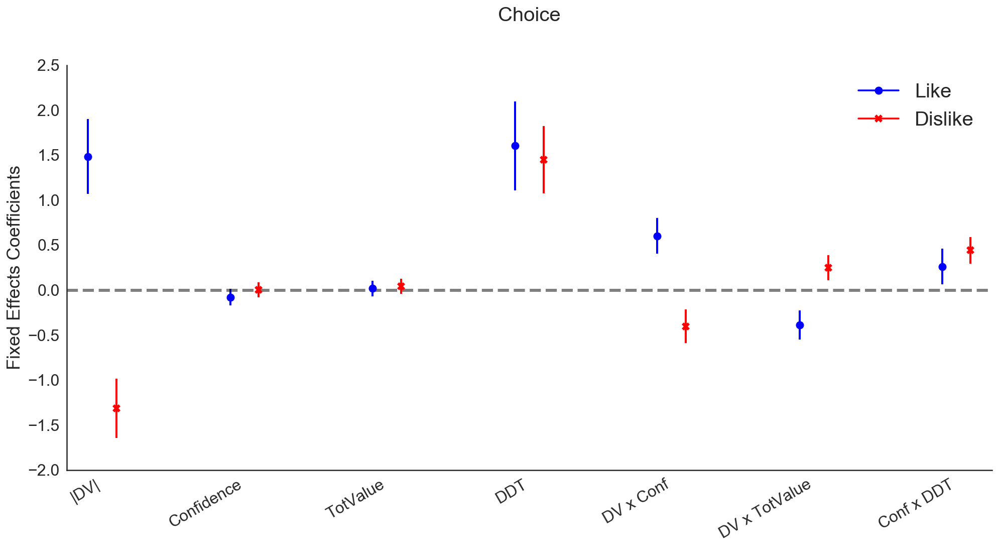

In [128]:
Coefpresplot2(Choice_Like_hmodel_table,Choice_Dislike_hmodel_table, title='Choice', intercept=True, ticklabsize=16, size='big', n_ET_predictors=0)

## Confidence ~ BehavioralParams + GSF

### Dislike condition model

In [129]:
%%R
# Fit the multilevel linear model
confidence_Dislike_hmodel <- lmer(zConf ~ -1 + zAbsDV +zRT +  ZtotVal + zGSF + ( zAbsDV + zRT  + ZtotVal + zGSF| Part), data=data_exp1_DisLike, control=lmerControl(optimizer="optimx", optCtrl=list(method="nlminb")))
display (confidence_Dislike_hmodel)

lmer(formula = zConf ~ -1 + zAbsDV + zRT + ZtotVal + zGSF + (zAbsDV + 
    zRT + ZtotVal + zGSF | Part), data = data_exp1_DisLike, control = lmerControl(optimizer = "optimx", 
    optCtrl = list(method = "nlminb")))
        coef.est coef.se
zAbsDV   0.15     0.02  
zRT     -0.26     0.03  
ZtotVal -0.08     0.03  
zGSF    -0.06     0.03  

Error terms:
 Groups   Name        Std.Dev. Corr                    
 Part     (Intercept) 0.12                             
          zAbsDV      0.11     -0.20                   
          zRT         0.16     -0.08 -0.46             
          ZtotVal     0.17      0.67 -0.34 -0.40       
          zGSF        0.13      0.05 -0.31 -0.02  0.39 
 Residual             0.91                             
---
number of obs: 3960, groups: Part, 33
AIC = 10690.8, DIC = 10607.6
deviance = 10629.2 


In [130]:
%%R

## Estimating DFs and p-values
# get the coefficients for the best fitting model
coefs <- data.frame(coef(summary(confidence_Dislike_hmodel)))
coefs
# Use the Kenward-Roger approximation to get approximate degrees of freedom
df.KR <- get_ddf_Lb(confidence_Dislike_hmodel, fixef(confidence_Dislike_hmodel))
coefs$df.KR <-(rep(df.KR, each=4))

# Calculate confidence intervals from the estimates and the standard errors
coefs$semax <- coefs$Estimate + (coefs$Std..Error)
coefs$semin <- coefs$Estimate - (coefs$Std..Error)

# get p-values from the t-distribution using the t-values and approximated
# degrees of freedom
coefs$p.KR <- 2 * (1 - pt(abs(coefs$t.value), df.KR))

# use normal distribution to approximate p-value (tends to be anti-conservative with small sample sizes)
coefs$p.z <- 2 * (1 - pnorm(abs(coefs$t.value)))

In [131]:
#%%R 
#coef(confidence_Dislike_hmodel)

In [132]:
%R -o coefs
conf_table_exp1 = coefs
conf_table_exp1

#Generate table with paramters to later plot
conf_table_exp1.columns = ['coefficient', 'se', 't', 'DF','CImax', 'CImin', 'p', 'p2' ]
conf_table_exp1 = conf_table_exp1.iloc[:, 0:-1].copy(); conf_table_exp1.loc[:, 'SEmax'] = conf_table_exp1['coefficient'] + conf_table_exp1['se']*2
conf_table_exp1.loc[:, 'SEmin'] = conf_table_exp1['coefficient'] - conf_table_exp1['se']*2
conf_table_exp1 = conf_table_exp1.transpose()
conf_table_exp1.columns = [ '|DV|', 'RT', 'TotValue','GSF']
conf_table_exp1.loc['p'] = np.round(conf_table_exp1.loc['p'], 4)
conf_table_exp1 = conf_table_exp1[['|DV|', 'RT', 'TotValue','GSF']]
conf_table_Dislike = conf_table_exp1
conf_table_Dislike

,|DV|,RT,TotValue,GSF
coefficient,0.147565,-0.263443,-0.083186,-0.060108
se,0.024597,0.033275,0.029004,0.029457
t,5.999425,-7.917157,-2.868124,-2.040535
DF,31.802090,31.802090,31.802090,31.802090
CImax,0.172162,-0.230168,-0.054182,-0.030651
CImin,0.122969,-0.296718,-0.112190,-0.089566
p,0.000000,0.000000,0.007300,0.049700
SEmax,0.196758,-0.196893,-0.025179,-0.001194
SEmin,0.098372,-0.329993,-0.141194,-0.119023


### Like Condition

In [133]:
%%R
# Fit the multilevel linear model
confidence_Like_hmodel <- lmer(zConf ~ -1 + zAbsDV +zRT  + ZtotVal + zGSF + (zAbsDV + zRT + ZtotVal + zGSF| Part), data=data_exp1_Like, control=lmerControl(optimizer="optimx", optCtrl=list(method="nlminb")))
display (confidence_Like_hmodel)

lmer(formula = zConf ~ -1 + zAbsDV + zRT + ZtotVal + zGSF + (zAbsDV + 
    zRT + ZtotVal + zGSF | Part), data = data_exp1_Like, control = lmerControl(optimizer = "optimx", 
    optCtrl = list(method = "nlminb")))
        coef.est coef.se
zAbsDV   0.11     0.02  
zRT     -0.31     0.04  
ZtotVal  0.12     0.02  
zGSF    -0.05     0.02  

Error terms:
 Groups   Name        Std.Dev. Corr                    
 Part     (Intercept) 0.12                             
          zAbsDV      0.09      0.29                   
          zRT         0.20      0.59  0.14             
          ZtotVal     0.15     -0.78  0.20 -0.12       
          zGSF        0.09     -0.23 -0.49  0.04  0.07 
 Residual             0.86                             
---
number of obs: 3960, groups: Part, 33
AIC = 10231.4, DIC = 10147.2
deviance = 10169.3 


In [134]:
%%R
## Estimating DFs and p-values
# get the coefficients for the best fitting model
coefs <- data.frame(coef(summary(confidence_Like_hmodel)))
coefs
# Use the Kenward-Roger approximation to get approximate degrees of freedom
df.KR <- get_ddf_Lb(confidence_Like_hmodel, fixef(confidence_Like_hmodel))
coefs$df.KR <-(rep(df.KR, each=4))

# Calculate confidence intervals from the estimates and the standard errors
coefs$semax <- coefs$Estimate + (coefs$Std..Error)
coefs$semin <- coefs$Estimate - (coefs$Std..Error)

# get p-values from the t-distribution using the t-values and approximated
# degrees of freedom
coefs$p.KR <- 2 * (1 - pt(abs(coefs$t.value), df.KR))

# use normal distribution to approximate p-value (tends to be anti-conservative with small sample sizes)
coefs$p.z <- 2 * (1 - pnorm(abs(coefs$t.value)))

In [135]:
%%R
coefs

           Estimate Std..Error   t.value    df.KR       semax       semin
zAbsDV   0.11279227 0.02114664  5.333816 31.63636  0.13393891  0.09164564
zRT     -0.31164005 0.03601899 -8.652104 31.63636 -0.27562106 -0.34765903
ZtotVal  0.11717603 0.02428659  4.824722 31.63636  0.14146262  0.09288944
zGSF    -0.05001313 0.02445798 -2.044859 31.63636 -0.02555515 -0.07447112
                p.KR          p.z
zAbsDV  7.774067e-06 9.616978e-08
zRT     7.606746e-10 0.000000e+00
ZtotVal 3.390140e-05 1.401986e-06
zGSF    4.926355e-02 4.086873e-02


In [136]:
%R -o coefs
conf_table_exp1 = coefs
conf_table_exp1

#Generate table with paramters to later plot
conf_table_exp1.columns = ['coefficient', 'se', 't', 'DF','CImax', 'CImin', 'p', 'p2' ]
conf_table_exp1 = conf_table_exp1.iloc[:, 0:-1].copy(); conf_table_exp1.loc[:, 'SEmax'] = conf_table_exp1['coefficient'] + conf_table_exp1['se']*2
conf_table_exp1.loc[:, 'SEmin'] = conf_table_exp1['coefficient'] - conf_table_exp1['se']*2
conf_table_exp1 = conf_table_exp1.transpose()
conf_table_exp1.columns = [ '|DV|', 'RT', 'TotValue','GSF']
conf_table_exp1.loc['p'] = np.round(conf_table_exp1.loc['p'], 4)
conf_table_exp1 = conf_table_exp1[['|DV|','RT', 'TotValue','GSF']]
conf_table_Like = conf_table_exp1
conf_table_Like

,|DV|,RT,TotValue,GSF
coefficient,0.112792,-0.311640,0.117176,-0.050013
se,0.021147,0.036019,0.024287,0.024458
t,5.333816,-8.652104,4.824722,-2.044859
DF,31.636357,31.636357,31.636357,31.636357
CImax,0.133939,-0.275621,0.141463,-0.025555
CImin,0.091646,-0.347659,0.092889,-0.074471
p,0.000000,0.000000,0.000000,0.049300
SEmax,0.155086,-0.239602,0.165749,-0.001097
SEmin,0.070499,-0.383678,0.068603,-0.098929


### Plotting both conditions

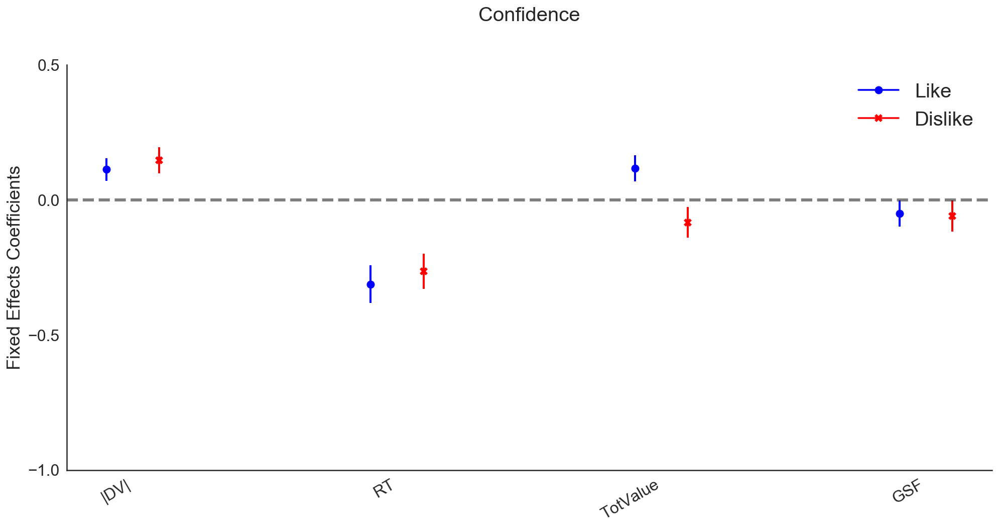

In [137]:
Coefpresplot2(conf_table_Like,conf_table_Dislike, title='Confidence', intercept=True, ticklabsize=16, size='big', n_ET_predictors=0)

## Choice ~ ValueChosen + ValueUnChosen + Confidence + TotalValue + DDT +(interactions)

### Dislike condition model

In [138]:
%%R
# Fit binomial hierarchical model
Choice_Dislike_hmodel =  glmer(ChosenITM ~ -1 + ZValCh + ZValUnCh + zConf + ZtotVal + zDDT + ZValCh:zConf + ZValCh:ZtotVal 
                               + ZValUnCh:zConf + ZValUnCh:ZtotVal  + zConf:zDDT
                               + (ZValCh + ZValUnCh  + zConf + ZtotVal + zDDT + ZValCh:zConf + ZValCh:ZtotVal + ZValUnCh:zConf 
                               + ZValUnCh:ZtotVal  + zConf:zDDT | Part), data=data_exp1_DisLike, family='binomial',
                    control=glmerControl(optimizer="optimx", optCtrl=list(method="nlminb")))
display (Choice_Dislike_hmodel)

glmer(formula = ChosenITM ~ -1 + ZValCh + ZValUnCh + zConf + 
    ZtotVal + zDDT + ZValCh:zConf + ZValCh:ZtotVal + ZValUnCh:zConf + 
    ZValUnCh:ZtotVal + zConf:zDDT + (ZValCh + ZValUnCh + zConf + 
    ZtotVal + zDDT + ZValCh:zConf + ZValCh:ZtotVal + ZValUnCh:zConf + 
    ZValUnCh:ZtotVal + zConf:zDDT | Part), data = data_exp1_DisLike, 
    family = "binomial", control = glmerControl(optimizer = "optimx", 
        optCtrl = list(method = "nlminb")))
                 coef.est coef.se
ZValCh            0.38     0.83  
ZValUnCh          0.40     0.82  
zConf             0.00     0.04  
ZtotVal          -0.52     1.17  
zDDT              1.61     0.20  
ZValCh:zConf      0.04     0.04  
ZValCh:ZtotVal    0.00     0.04  
ZValUnCh:zConf   -0.01     0.04  
ZValUnCh:ZtotVal -0.03     0.04  
zConf:zDDT        0.52     0.09  

Error terms:
 Groups   Name             Std.Dev. Corr                                     
 Part     (Intercept)      0.03                                              
 

In [139]:
%%R

#Extract parameters
fix_Choice_Dislike_hmodel <- fixef(Choice_Dislike_hmodel)
fix_se_Choice_Dislike_hmodel <- sqrt(diag(vcov(Choice_Dislike_hmodel)))
names_Choice_Dislike_hmodel <- names(fix_Choice_Dislike_hmodel)
summary(Choice_Dislike_hmodel)


Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: ChosenITM ~ -1 + ZValCh + ZValUnCh + zConf + ZtotVal + zDDT +  
    ZValCh:zConf + ZValCh:ZtotVal + ZValUnCh:zConf + ZValUnCh:ZtotVal +  
    zConf:zDDT + (ZValCh + ZValUnCh + zConf + ZtotVal + zDDT +  
    ZValCh:zConf + ZValCh:ZtotVal + ZValUnCh:zConf + ZValUnCh:ZtotVal +  
    zConf:zDDT | Part)
   Data: data_exp1_DisLike
Control: glmerControl(optimizer = "optimx", optCtrl = list(method = "nlminb"))

     AIC      BIC   logLik deviance df.resid 
  4686.6   5164.2  -2267.3   4534.6     3884 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-39.211  -0.801   0.001   0.829  13.351 

Random effects:
 Groups Name             Variance  Std.Dev. Corr                               
 Part   (Intercept)      0.0006511 0.02552                                     
        ZValCh           0.0837876 0.28946  -0.34                              
        ZV

In [140]:
%R -o fix_Choice_Dislike_hmodel -o fix_se_Choice_Dislike_hmodel -o names_Choice_Dislike_hmodel

#Generate table with parameters to plot
Choice_Dislike_hmodel_table = regtable(fix_Choice_Dislike_hmodel, fix_se_Choice_Dislike_hmodel, names_Choice_Dislike_hmodel)

Choice_Dislike_hmodel_table.columns = [ 'ChosenValue','UnchosenValue','Confidence', "TotValue", "DDT", "ChosenVal x Conf", "ChosenVal x TotValue", 
                                       "UnchosenVal x Conf", "UnchosenVal x TotValue", "Conf x DDT"]
#Coefpresplot(Choice_Dislike_hmodel_table, title='', ticklabsize=16, size='narrow', ymultiple=0.5, n_ET_predictors=2)
#[i.set_color('#03719c') for i in plt.gca().get_xticklabels()[4:]]
#plt.savefig('../../figures/CoM_cut_slow_1.png', dpi=600, bbox_inches='tight')

### Like Condition

In [141]:
%%R
# Fit binomial hierarchical model
Choice_Like_hmodel =  glmer(ChosenITM ~ -1 + ZValCh + ZValUnCh + zConf + ZtotVal + zDDT + ZValCh:zConf + ZValCh:ZtotVal 
                               + ZValUnCh:zConf + ZValUnCh:ZtotVal  + zConf:zDDT
                               + (ZValCh + ZValUnCh  + zConf + ZtotVal + zDDT + ZValCh:zConf + ZValCh:ZtotVal + ZValUnCh:zConf 
                               + ZValUnCh:ZtotVal  + zConf:zDDT | Part), data=data_exp1_Like, family='binomial',
                    control=glmerControl(optimizer="optimx", optCtrl=list(method="nlminb")))
display (Choice_Like_hmodel)

glmer(formula = ChosenITM ~ -1 + ZValCh + ZValUnCh + zConf + 
    ZtotVal + zDDT + ZValCh:zConf + ZValCh:ZtotVal + ZValUnCh:zConf + 
    ZValUnCh:ZtotVal + zConf:zDDT + (ZValCh + ZValUnCh + zConf + 
    ZtotVal + zDDT + ZValCh:zConf + ZValCh:ZtotVal + ZValUnCh:zConf + 
    ZValUnCh:ZtotVal + zConf:zDDT | Part), data = data_exp1_Like, 
    family = "binomial", control = glmerControl(optimizer = "optimx", 
        optCtrl = list(method = "nlminb")))
                 coef.est coef.se
ZValCh            0.24     0.85  
ZValUnCh          0.25     0.84  
zConf            -0.05     0.04  
ZtotVal          -0.34     1.19  
zDDT              1.84     0.29  
ZValCh:zConf     -0.02     0.04  
ZValCh:ZtotVal    0.00     0.04  
ZValUnCh:zConf    0.04     0.05  
ZValUnCh:ZtotVal  0.05     0.04  
zConf:zDDT        0.43     0.11  

Error terms:
 Groups   Name             Std.Dev. Corr                                     
 Part     (Intercept)      0.09                                              
    

In [142]:
%%R
#Extract regression parameters
fix_Choice_Like_hmodel <- fixef(Choice_Like_hmodel)
fix_se_Choice_Like_hmodel <- sqrt(diag(vcov(Choice_Like_hmodel)))
names_Choice_Like_hmodel <- names(Choice_Like_hmodel)
summary(Choice_Like_hmodel)

Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: ChosenITM ~ -1 + ZValCh + ZValUnCh + zConf + ZtotVal + zDDT +  
    ZValCh:zConf + ZValCh:ZtotVal + ZValUnCh:zConf + ZValUnCh:ZtotVal +  
    zConf:zDDT + (ZValCh + ZValUnCh + zConf + ZtotVal + zDDT +  
    ZValCh:zConf + ZValCh:ZtotVal + ZValUnCh:zConf + ZValUnCh:ZtotVal +  
    zConf:zDDT | Part)
   Data: data_exp1_Like
Control: glmerControl(optimizer = "optimx", optCtrl = list(method = "nlminb"))

     AIC      BIC   logLik deviance df.resid 
  4576.5   5054.1  -2212.2   4424.5     3884 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-17.209  -0.783   0.001   0.828  60.609 

Random effects:
 Groups Name             Variance  Std.Dev. Corr                               
 Part   (Intercept)      0.0073532 0.08575                                     
        ZValCh           0.1478149 0.38447  -0.22                              
        ZValU

In [143]:
%R -o fix_Choice_Like_hmodel -o fix_se_Choice_Like_hmodel #-o names_Choice_Like_hmodel

# we use the same names that were defined for the predictors that in the dislike case, since they are the same in both cases
Choice_Like_hmodel_table = regtable(fix_Choice_Like_hmodel, fix_se_Choice_Like_hmodel, names_Choice_Dislike_hmodel)
Choice_Like_hmodel_table.columns = [ 'ChosenValue','UnchosenValue','Confidence', "TotValue", "DDT", "ChosenVal x Conf", "ChosenVal x TotValue", 
                                       "UnchosenVal x Conf", "UnchosenVal x TotValue", "Conf x DDT"]
#Coefpresplot(Choice_Like_hmodel_table, title='', ticklabsize=16, size='narrow', ymultiple=0.5, n_ET_predictors=2)
#[i.set_color('#03719c') for i in plt.gca().get_xticklabels()[4:]]
#plt.savefig('../../figures/CoM_cut_slow_1.png', dpi=600, bbox_inches='tight')


### Plotting both conditions

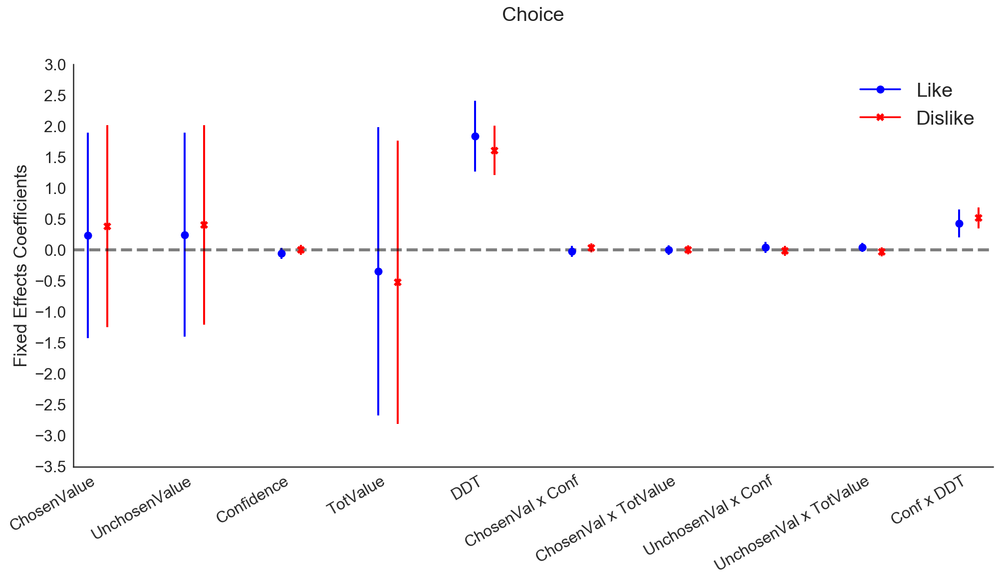

In [144]:
Coefpresplot2(Choice_Like_hmodel_table,Choice_Dislike_hmodel_table,title='Choice', intercept=True, ticklabsize=16, size='big', n_ET_predictors=0)

## Confidence ~ ReactionTime + ValueChosen + ValueUnChosen + TotalValue + GSF

### Dislike condition model

In [145]:
%%R
# Fit the multilevel linear model
confidence_Dislike_hmodel <- lmer(zConf ~ -1 +  ZValCh + ZValUnCh + zRT + ZtotVal + zGSF + (  ZValCh + ZValUnCh + zRT  + ZtotVal + zGSF| Part), data=data_exp1_DisLike, control=lmerControl(optimizer="optimx", optCtrl=list(method="nlminb")))
display (confidence_Dislike_hmodel)

lmer(formula = zConf ~ -1 + ZValCh + ZValUnCh + zRT + ZtotVal + 
    zGSF + (ZValCh + ZValUnCh + zRT + ZtotVal + zGSF | Part), 
    data = data_exp1_DisLike, control = lmerControl(optimizer = "optimx", 
        optCtrl = list(method = "nlminb")))
         coef.est coef.se
ZValCh   -0.29     0.52  
ZValUnCh -0.16     0.51  
zRT      -0.28     0.04  
ZtotVal   0.32     0.73  
zGSF     -0.06     0.03  

Error terms:
 Groups   Name        Std.Dev. Corr                          
 Part     (Intercept) 0.26                                   
          ZValCh      0.83     -0.54                         
          ZValUnCh    0.89     -0.82  0.92                   
          zRT         0.18     -0.15 -0.33 -0.17             
          ZtotVal     1.32      0.77 -0.95 -0.99  0.17       
          zGSF        0.13     -0.09  0.09  0.10  0.02 -0.05 
 Residual             0.89                                   
---
number of obs: 3960, groups: Part, 33
AIC = 10596.6, DIC = 10501.5
deviance = 10522

In [146]:
%%R

## Estimating DFs and p-values
# get the coefficients for the best fitting model
coefs <- data.frame(coef(summary(confidence_Dislike_hmodel)))
coefs
# Use the Kenward-Roger approximation to get approximate degrees of freedom
df.KR <- get_ddf_Lb(confidence_Dislike_hmodel, fixef(confidence_Dislike_hmodel))
coefs$df.KR <-(rep(df.KR, each=5))

# Calculate confidence intervals from the estimates and the standard errors
coefs$semax <- coefs$Estimate + (coefs$Std..Error)
coefs$semin <- coefs$Estimate - (coefs$Std..Error)

# get p-values from the t-distribution using the t-values and approximated
# degrees of freedom
coefs$p.KR <- 2 * (1 - pt(abs(coefs$t.value), df.KR))

# use normal distribution to approximate p-value (tends to be anti-conservative with small sample sizes)
coefs$p.z <- 2 * (1 - pnorm(abs(coefs$t.value)))

In [147]:
#%%R 
#coef(confidence_Dislike_hmodel)

In [148]:
%R -o coefs
conf_table_exp1 = coefs
conf_table_exp1


#Generate table with paramters to later plot
conf_table_exp1.columns = ['coefficient', 'se', 't', 'DF','CImax', 'CImin', 'p', 'p2' ]
conf_table_exp1 = conf_table_exp1.iloc[:, 0:-1].copy(); conf_table_exp1.loc[:, 'SEmax'] = conf_table_exp1['coefficient'] + conf_table_exp1['se']*2
conf_table_exp1.loc[:, 'SEmin'] = conf_table_exp1['coefficient'] - conf_table_exp1['se']*2
conf_table_exp1 = conf_table_exp1.transpose()
conf_table_exp1.columns = [ 'ValueChosen', 'ValueUnchosen', 'RT', 'TotValue','GSF']
conf_table_exp1.loc['p'] = np.round(conf_table_exp1.loc['p'], 4)
conf_table_exp1 = conf_table_exp1[['ValueChosen', 'ValueUnchosen', 'RT', 'TotValue','GSF']]
conf_table_Dislike = conf_table_exp1
conf_table_Dislike

,ValueChosen,ValueUnchosen,RT,TotValue,GSF
coefficient,-0.286055,-0.158570,-0.281370,0.321464,-0.061945
se,0.521568,0.508888,0.036868,0.727271,0.028342
t,-0.548451,-0.311601,-7.631836,0.442014,-2.185663
DF,7.271441,7.271441,7.271441,7.271441,7.271441
CImax,0.235514,0.350317,-0.244502,1.048735,-0.033604
CImin,-0.807623,-0.667458,-0.318238,-0.405807,-0.090287
p,0.599800,0.764100,0.000100,0.671300,0.063700
SEmax,0.757082,0.859205,-0.207634,1.776007,-0.005262
SEmin,-1.329191,-1.176345,-0.355106,-1.133079,-0.118628


### Like Condition

In [149]:
%%R
# Fit the multilevel linear model
confidence_Like_hmodel <- lmer(zConf ~ -1 + ZValCh + ZValUnCh + zRT + ZtotVal + zGSF + (ZValCh + ZValUnCh + zRT + ZtotVal + zGSF| Part), data=data_exp1_Like, control=lmerControl(optimizer="optimx", optCtrl=list(method="nlminb")))
display (confidence_Like_hmodel)

lmer(formula = zConf ~ -1 + ZValCh + ZValUnCh + zRT + ZtotVal + 
    zGSF + (ZValCh + ZValUnCh + zRT + ZtotVal + zGSF | Part), 
    data = data_exp1_Like, control = lmerControl(optimizer = "optimx", 
        optCtrl = list(method = "nlminb")))
         coef.est coef.se
ZValCh   -0.69     0.44  
ZValUnCh -0.95     0.43  
zRT      -0.23     0.04  
ZtotVal   1.22     0.62  
zGSF     -0.05     0.02  

Error terms:
 Groups   Name        Std.Dev. Corr                          
 Part     (Intercept) 0.13                                   
          ZValCh      1.17     -0.26                         
          ZValUnCh    1.04     -0.22  1.00                   
          zRT         0.18      0.35 -0.14 -0.18             
          ZtotVal     1.57      0.16 -0.99 -1.00  0.15       
          zGSF        0.09      0.24 -0.75 -0.77  0.24  0.74 
 Residual             0.85                                   
---
number of obs: 3960, groups: Part, 33
AIC = 10155.8, DIC = 10058.5
deviance = 10080.1 

In [150]:
%%R
## Estimating DFs and p-values
# get the coefficients for the best fitting model
coefs <- data.frame(coef(summary(confidence_Like_hmodel)))
coefs
# Use the Kenward-Roger approximation to get approximate degrees of freedom
df.KR <- get_ddf_Lb(confidence_Like_hmodel, fixef(confidence_Like_hmodel))
coefs$df.KR <-(rep(df.KR, each=5))

# Calculate confidence intervals from the estimates and the standard errors
coefs$semax <- coefs$Estimate + (coefs$Std..Error)
coefs$semin <- coefs$Estimate - (coefs$Std..Error)

# get p-values from the t-distribution using the t-values and approximated
# degrees of freedom
coefs$p.KR <- 2 * (1 - pt(abs(coefs$t.value), df.KR))

# use normal distribution to approximate p-value (tends to be anti-conservative with small sample sizes)
coefs$p.z <- 2 * (1 - pnorm(abs(coefs$t.value)))

In [151]:
#%%R
#coefs

In [152]:
%R -o coefs
conf_table_exp1 = coefs
conf_table_exp1

#Generate table with paramters to later plot
conf_table_exp1.columns = ['coefficient', 'se', 't', 'DF','CImax', 'CImin', 'p', 'p2' ]
conf_table_exp1 = conf_table_exp1.iloc[:, 0:-1].copy(); conf_table_exp1.loc[:, 'SEmax'] = conf_table_exp1['coefficient'] + conf_table_exp1['se']*2
conf_table_exp1.loc[:, 'SEmin'] = conf_table_exp1['coefficient'] - conf_table_exp1['se']*2
conf_table_exp1 = conf_table_exp1.transpose()
conf_table_exp1.columns = [ 'ValueChosen', 'ValueUnchosen','RT', 'TotValue','GSF']
conf_table_exp1.loc['p'] = np.round(conf_table_exp1.loc['p'], 4)
conf_table_exp1 = conf_table_exp1[['ValueChosen', 'ValueUnchosen', 'RT', 'TotValue','GSF']]
conf_table_Like = conf_table_exp1
conf_table_Like

,ValueChosen,ValueUnchosen,RT,TotValue,GSF
coefficient,-0.691556,-0.947720,-0.233805,1.218062,-0.051768
se,0.442645,0.429506,0.035805,0.616849,0.024262
t,-1.562326,-2.206536,-6.529923,1.974651,-2.133678
DF,7.801153,7.801153,7.801153,7.801153,7.801153
CImax,-0.248911,-0.518214,-0.197999,1.834911,-0.027505
CImin,-1.134201,-1.377226,-0.269610,0.601213,-0.076030
p,0.157800,0.059200,0.000200,0.084700,0.066300
SEmax,0.193734,-0.088708,-0.162194,2.451761,-0.003243
SEmin,-1.576847,-1.806732,-0.305415,-0.015637,-0.100292


### Plotting both conditions

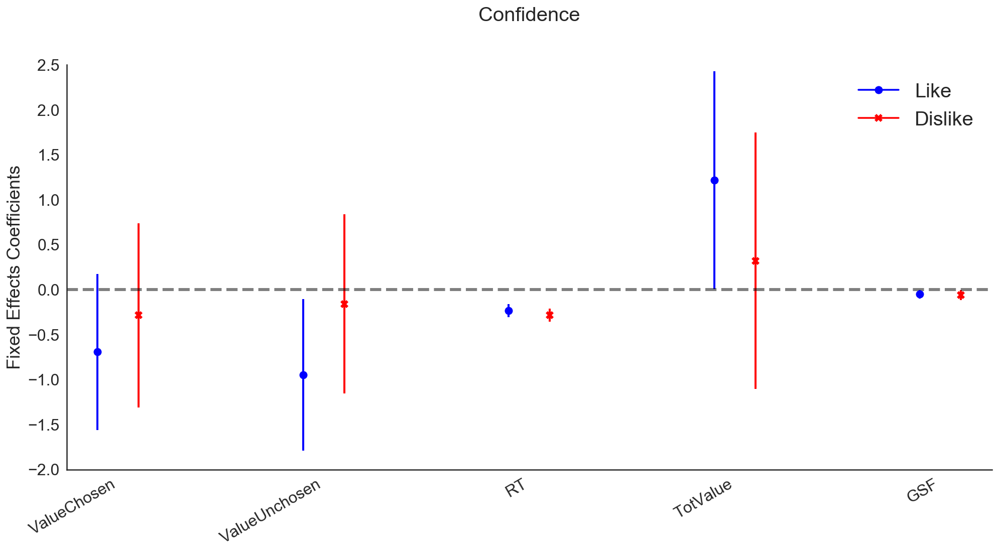

In [153]:
Coefpresplot2(conf_table_Like,conf_table_Dislike, title='Confidence', intercept=True, ticklabsize=16, size='big', n_ET_predictors=0)

## Additional tests

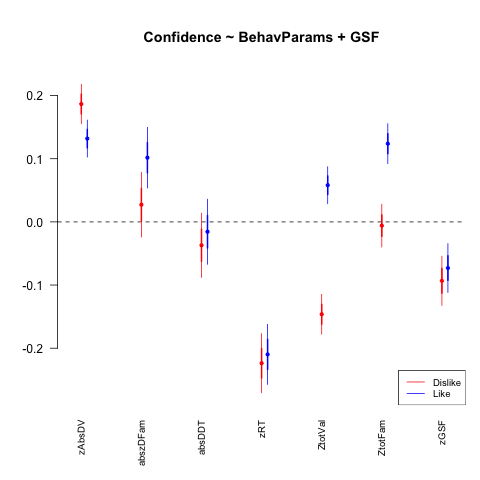

In [498]:
%%R
# Figure replicating Folke 2016. 

ModelConfidenceL_A1 <- glm(zConf ~ zAbsDV + abszDFam+ absDDT + zRT  + ZtotVal +ZtotFam+  zGSF  , data=data_exp1_Like)
ModelConfidenceD_A1 <- glm(zConf ~ zAbsDV  +abszDFam+ absDDT + zRT + ZtotVal +ZtotFam+ zGSF , data=data_exp1_DisLike)

coefplot(ModelConfidenceD_A1,intercept=FALSE, vertical = FALSE, col.pts="red", offset = 0.05, mar = c(3,4,5,1) ,main="Confidence ~ BehavParams + GSF")
coefplot(ModelConfidenceL_A1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue",mar = c(3,4,5,1),main="RegEstim")
legend("bottomright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=0.8)

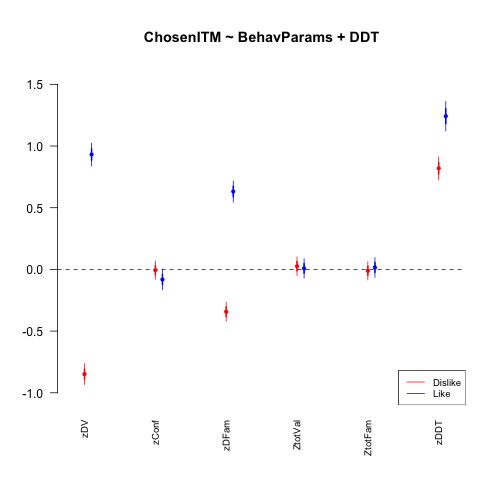

In [500]:
%%R

ModelChoiceL_A1 <- glm(ChosenITM ~ zDV + zConf + zDFam + ZtotVal +ZtotFam+ zDDT , data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_A1 <- glm(ChosenITM ~ zDV + zConf + zDFam + ZtotVal+ ZtotFam+ zDDT, data=data_exp1_DisLike, family=binomial(link="logit"))

coefplot(ModelChoiceD_A1,intercept=FALSE,vertical = FALSE,  col.pts="red", mar = c(3,4,5,1) ,ylim=c(-1.0, 1.5) ,main="ChosenITM ~ BehavParams + DDT")
coefplot(ModelChoiceL_A1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue",mar = c(3,4,5,1))
legend("bottomright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=0.8)

In [155]:
# --------------END --------------------------------------------------